# </font> <font color="#4ECDC4"><b><big> IMPORTING DATASET</big></b></font>



In [1]:
from google.colab import files
import pandas as pd

uploaded = files.upload()

Saving 2015.csv to 2015 (2).csv


In [2]:
FILE_path = "2015.csv"


data = pd.read_csv(FILE_path)


data.head()

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176



# <font color="#FCC737"><b><big>EXPLORING DATASET (Cleaning and Preprocessing)</big></b></font>




In [3]:
print("DATASET INFORMATION")
data.info()

DATASET INFORMATION
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 158 entries, 0 to 157
Data columns (total 12 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Country                        158 non-null    object 
 1   Region                         158 non-null    object 
 2   Happiness Rank                 158 non-null    int64  
 3   Happiness Score                158 non-null    float64
 4   Standard Error                 158 non-null    float64
 5   Economy (GDP per Capita)       158 non-null    float64
 6   Family                         158 non-null    float64
 7   Health (Life Expectancy)       158 non-null    float64
 8   Freedom                        158 non-null    float64
 9   Trust (Government Corruption)  158 non-null    float64
 10  Generosity                     158 non-null    float64
 11  Dystopia Residual              158 non-null    float64
dtypes: float64(9), int64(1), objec

### **Interpretation:**
This dataset has 158 countries and 12 columns. It shows each country’s happiness rank and score, along with factors like economy, family, health, freedom, trust, generosity, and a dystopia residual.

### ***<font color="#FF69B4"><b><big>Columns Names</big></b></font>***

In [4]:
for i, col in enumerate(data.columns, 1):
    print(f"{i}. {col}")

1. Country
2. Region
3. Happiness Rank
4. Happiness Score
5. Standard Error
6. Economy (GDP per Capita)
7. Family
8. Health (Life Expectancy)
9. Freedom
10. Trust (Government Corruption)
11. Generosity
12. Dystopia Residual


In [5]:
print("STATISTICAL SUMMARY:")
data.describe()

STATISTICAL SUMMARY:


,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
count,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000,158.000000
mean,79.493671,5.375734,0.047885,0.846137,0.991046,0.630259,0.428615,0.143422,0.237296,2.098977
std,45.754363,1.145010,0.017146,0.403121,0.272369,0.247078,0.150693,0.120034,0.126685,0.553550
min,1.000000,2.839000,0.018480,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.328580
25%,40.250000,4.526000,0.037268,0.545808,0.856823,0.439185,0.328330,0.061675,0.150553,1.759410
50%,79.500000,5.232500,0.043940,0.910245,1.029510,0.696705,0.435515,0.107220,0.216130,2.095415
75%,118.750000,6.243750,0.052300,1.158448,1.214405,0.811013,0.549092,0.180255,0.309883,2.462415
max,158.000000,7.587000,0.136930,1.690420,1.402230,1.025250,0.669730,0.551910,0.795880,3.602140


### **Interpretation:**

* Some countries are very happy, others rank much lower. From the min (2.839) and max (7.587) happiness scores, we can see a big gap between the happiest and least happy countries.

*   Happiness is influenced economy, health, family support, freedom, trust, and generosity as their values vary across countries, which explains differences in happiness scores.

*   Most scores are reliable, showing consistent patterns. The standard error is small (average ~0.048), which means the happiness scores are  precise.




### ***<font color="#FF69B4"><b><big>Dataset Dimensions</big></b></font>***

In [6]:

print(f"Total Countries: {data.shape[0]}")
print(f"Total Columns: {data.shape[1]}")
print()

print(" COLUMNS AND DATA TYPES")
print("------------------------------------------------------" )
for idx, (col, dtype) in enumerate(zip(data.columns, data.dtypes), 1):
    print(f"{idx:2d}. {col:30s}  {dtype}")

Total Countries: 158
Total Columns: 12

 COLUMNS AND DATA TYPES
------------------------------------------------------
 1. Country                         object
 2. Region                          object
 3. Happiness Rank                  int64
 4. Happiness Score                 float64
 5. Standard Error                  float64
 6. Economy (GDP per Capita)        float64
 7. Family                          float64
 8. Health (Life Expectancy)        float64
 9. Freedom                         float64
10. Trust (Government Corruption)   float64
11. Generosity                      float64
12. Dystopia Residual               float64



### ***<font color="#FF69B4"><b><big>Missing Values Analysis</big></b></font>***

In [7]:
factors = ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
           'Freedom', 'Trust (Government Corruption)', 'Generosity']

zero_mask = (data[factors] == 0).any(axis=1)
countries_with_zeros = data[zero_mask].copy()

print(f"\nTotal countries with zero values: {len(countries_with_zeros)}")
print(f"Percentage of dataset: {(len(countries_with_zeros)/len(data)*100):.1f}%")

print("\nAffected countries:")
for idx, row in countries_with_zeros.iterrows():
    zeros_in = [col for col in factors if row[col] == 0]
    print(f"  {row['Country']:30s}  Region: {row['Region']:30s}   Zero in: {', '.join(zeros_in)}")



Total countries with zero values: 6
Percentage of dataset: 3.8%

Affected countries:
  Indonesia                       Region: Southeastern Asia                Zero in: Trust (Government Corruption)
  Greece                          Region: Western Europe                   Zero in: Generosity
  Iraq                            Region: Middle East and Northern Africa   Zero in: Freedom
  Congo (Kinshasa)                Region: Sub-Saharan Africa               Zero in: Economy (GDP per Capita)
  Sierra Leone                    Region: Sub-Saharan Africa               Zero in: Health (Life Expectancy)
  Central African Republic        Region: Sub-Saharan Africa               Zero in: Family


### **Interpretation:**

* **6 countries** have zero values, which is **about 3.8%** of the dataset.

* **Affected countries and factors:**

  * **Indonesia:** zero in Trust (Government Corruption)
  * **Greece:** zero in Generosity
  * **Iraq:** zero in Freedom
  * **Congo (Kinshasa):** zero in Economy (GDP per Capita)
  * **Sierra Leone:** zero in Health (Life Expectancy)
  * **Central African Republic:** zero in Family

Now we will deal with these missing values.


In [8]:
import numpy as np

cols_with_invalid_zero = [
    'Economy (GDP per Capita)',
    'Family',
    'Health (Life Expectancy)',
    'Freedom',
    'Trust (Government Corruption)',
    'Generosity'
]


data[cols_with_invalid_zero] = data[cols_with_invalid_zero].replace(0, np.nan)


for col in cols_with_invalid_zero:
    data[col] = data.groupby("Region")[col].transform(
        lambda x: x.fillna(x.median())
    )
print("Remaining zeros:\n", (data[cols_with_invalid_zero] == 0).sum())
print("\nRemaining missing values:\n", data[cols_with_invalid_zero].isna().sum())


Remaining zeros:
 Economy (GDP per Capita)         0
Family                           0
Health (Life Expectancy)         0
Freedom                          0
Trust (Government Corruption)    0
Generosity                       0
dtype: int64

Remaining missing values:
 Economy (GDP per Capita)         0
Family                           0
Health (Life Expectancy)         0
Freedom                          0
Trust (Government Corruption)    0
Generosity                       0
dtype: int64


### **Interpretation:**
Some columns in the dataset had **zero values that are not realistic**, like GDP, Life Expectancy, Freedom, or Trust in Government. These affected **only 6 values (about 3.8% of the dataset)**, so removing rows was unnecessary. Instead, we treated these zeros as **missing values** and filled them using **region-wise median imputation**.

We chose **region-wise medians** because countries in the same region tend to have **similar economic, social, and political conditions**. For example:

* Indonesia’s zero Trust score was replaced with the **median of Southeast Asia**,
* Congo’s zero GDP used the **median of Sub-Saharan Africa**,
* Greece’s zero Generosity used the **median of Western Europe**, and so on.

This method is **better than using a global mean or median**, because it preserves the **natural regional patterns** .

### ***<font color="#FF69B4"><b><big>Checking Duplicates</big></b></font>***

In [9]:

duplicate_rows = data.duplicated()
total_duplicates = duplicate_rows.sum()

print(f"\nTotal duplicate rows (exact copies): {total_duplicates}")

if total_duplicates > 0:
    print("\nDuplicate rows found:")
    print(data[duplicate_rows])
    print("\nOriginal rows that have duplicates:")
    print(data[data.duplicated(keep=False)])
else:
    print("No duplicate rows found")


duplicate_countries = data['Country'].duplicated()
total_country_duplicates = duplicate_countries.sum()

print(f"\n\nDuplicate country names: {total_country_duplicates}")

if total_country_duplicates > 0:
    print("\nCountries appearing multiple times:")
    print(data[duplicate_countries][['Country', 'Region', 'Happiness Rank']])
else:
    print("No duplicate country names found")



Total duplicate rows (exact copies): 0
No duplicate rows found


Duplicate country names: 0
No duplicate country names found


### **Interpretation:**


* There are no duplicate rows in the dataset.
* All country names are unique.
* This means the data doesn’t have repeated entries.


### ***<font color="#FF69B4"><b><big>Data Type Validation</big></b></font>***

In [10]:
numeric_cols = ['Happiness Rank', 'Happiness Score', 'Standard Error',
                'Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
                'Freedom', 'Trust (Government Corruption)', 'Generosity',
                'Dystopia Residual']

print("Checking numeric columns:")
for col in data.columns:
    if col in numeric_cols:
        is_numeric = pd.api.types.is_numeric_dtype(data[col])
        status = "Correct: " if is_numeric else "False: "
        print(f"{status} {col:40s}  {data[col].dtype}")

Checking numeric columns:
Correct:  Happiness Rank                            int64
Correct:  Happiness Score                           float64
Correct:  Standard Error                            float64
Correct:  Economy (GDP per Capita)                  float64
Correct:  Family                                    float64
Correct:  Health (Life Expectancy)                  float64
Correct:  Freedom                                   float64
Correct:  Trust (Government Corruption)             float64
Correct:  Generosity                                float64
Correct:  Dystopia Residual                         float64


### **Interpretation:**
* All numeric columns have the correct data types.
* 'Happiness Rank' is an integer, while all other numeric columns are floats.



### ***<font color="#FF69B4"><b><big>Value Range Analysis</big></b></font>***

In [11]:
#limit: 0 to 10
if 'Happiness Score' in data.columns:
    print(f"Happiness Score range: {data['Happiness Score'].min():.3f} to {data['Happiness Score'].max():.3f}")


    invalid_happiness = data[(data['Happiness Score'] < 0) | (data['Happiness Score'] > 10)]
    if len(invalid_happiness) > 0:
        print(f" Found {len(invalid_happiness)} countries with invalid happiness scores")
    else:
        print("All happiness scores are valid (0-10 range)")

print()

# factor columns should be >= 0
factor_cols = ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
               'Freedom', 'Trust (Government Corruption)', 'Generosity']

print("Checking factor columns for negative values:")
for col in factor_cols:
    if col in data.columns:
        negative_count = (data[col] < 0).sum()
        if negative_count > 0:
            print(f" {col}: {negative_count} negative values found")
        else:
            print(f" {col}: No negative values")

Happiness Score range: 2.839 to 7.587
All happiness scores are valid (0-10 range)

Checking factor columns for negative values:
 Economy (GDP per Capita): No negative values
 Family: No negative values
 Health (Life Expectancy): No negative values
 Freedom: No negative values
 Trust (Government Corruption): No negative values
 Generosity: No negative values


### **Interpretation:**

* Happiness scores range from 2.839 to 7.587, all within the valid 0–10 scale.
* All factor columns like Economy, Family, Health, Freedom, Trust, Generosity have no negative values.


### ***<font color="#FF69B4"><b><big>Sample Data From Each Region</big></b></font>***

In [12]:
if 'Region' in data.columns:
    regions = data['Region'].unique()
    print(f"Total regions: {len(regions)}\n")

    for region in sorted(regions):
        print(f"\n{'---------------------------------------------'}")
        print(f"Region: {region}")
        print(f"\n{'---------------------------------------------'}")
        region_data = data[data['Region'] == region].head(3)
        print(region_data[['Country', 'Happiness Rank', 'Happiness Score']].to_string(index=False))
        print(f"(Showing 3 of {len(data[data['Region'] == region])} countries)")

Total regions: 10


---------------------------------------------
Region: Australia and New Zealand

---------------------------------------------
    Country  Happiness Rank  Happiness Score
New Zealand               9            7.286
  Australia              10            7.284
(Showing 3 of 2 countries)

---------------------------------------------
Region: Central and Eastern Europe

---------------------------------------------
       Country  Happiness Rank  Happiness Score
Czech Republic              31            6.505
    Uzbekistan              44            6.003
      Slovakia              45            5.995
(Showing 3 of 29 countries)

---------------------------------------------
Region: Eastern Asia

---------------------------------------------
    Country  Happiness Rank  Happiness Score
     Taiwan              38            6.298
      Japan              46            5.987
South Korea              47            5.984
(Showing 3 of 6 countries)

-------------------

### **Interpretation:**

*   The dataset has 10 regions with varying numbers of countries.

*   Western Europe and Australia and New Zealand have the highest happiness scores (7+).
*   North America also scores high, while Southern Asia and Sub-Saharan Africa show lower scores (around 4.7–5.5).

*   Central and Eastern Europe, Eastern Asia, and Southeastern Asia fall in the mid-range (around 5.9–6.8).

This shows that happiness differs by region, reflecting differences in wealth, health, social support, and freedom.

### ***<font color="#FF69B4"><b><big>Outlier Detection and Removal</big></b></font>***

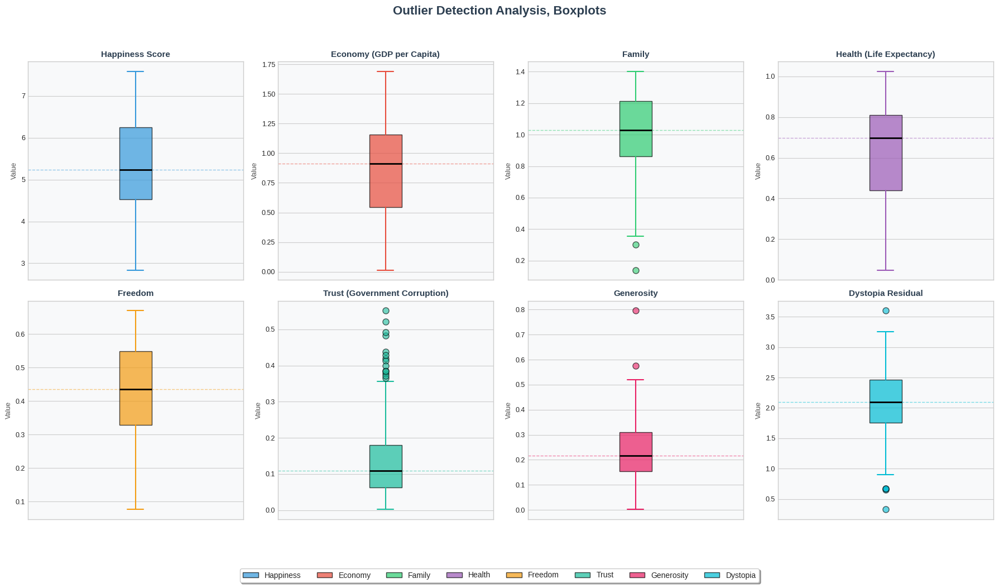

In [13]:

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch


numeric_cols = ['Happiness Score', 'Economy (GDP per Capita)', 'Family',
                'Health (Life Expectancy)', 'Freedom',
                'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual']


colors = ['#3498db', '#e74c3c', '#2ecc71', '#9b59b6',
          '#f39c12', '#1abc9c', '#e91e63', '#00bcd4']

short_labels = ['Happiness', 'Economy', 'Family', 'Health',
                'Freedom', 'Trust', 'Generosity', 'Dystopia']


plt.style.use('seaborn-v0_8-whitegrid')
fig, axes = plt.subplots(2, 4, figsize=(18, 10))
axes = axes.flatten()

for idx, col in enumerate(numeric_cols):

    bp = axes[idx].boxplot(data[col].dropna(),
                           patch_artist=True,
                           boxprops=dict(facecolor=colors[idx], color='black', alpha=0.7),
                           medianprops=dict(color='black', linewidth=2),
                           whiskerprops=dict(color=colors[idx], linewidth=1.5),
                           capprops=dict(color=colors[idx], linewidth=1.5),
                           flierprops=dict(marker='o', markerfacecolor=colors[idx],
                                          markersize=8, markeredgecolor='black', alpha=0.6))


    axes[idx].set_title(f'{col}', fontsize=11, fontweight='bold', color='#2c3e50')
    axes[idx].set_ylabel('Value', fontsize=9, color='#555')
    axes[idx].tick_params(axis='y', labelsize=9)
    axes[idx].set_xticks([])


    axes[idx].set_facecolor('#f8f9fa')

    median_val = data[col].median()
    axes[idx].axhline(y=median_val, color=colors[idx], linestyle='--', alpha=0.5, linewidth=1)

legend_patches = [Patch(facecolor=colors[i], edgecolor='black', label=short_labels[i], alpha=0.7)
                  for i in range(len(numeric_cols))]


fig.suptitle('Outlier Detection Analysis, Boxplots',
             fontsize=16, fontweight='bold', color='#2c3e50', y=1.02)


fig.legend(handles=legend_patches,
           loc='lower center',
           ncol=8,
           fontsize=10,
           frameon=True,
           fancybox=True,
           shadow=True,
           bbox_to_anchor=(0.5, -0.02))




plt.tight_layout()
plt.subplots_adjust(bottom=0.1, top=0.92)
plt.show()

### **Interpretation:**

1. Happiness Score
Most countries score 4.5-6.3, with median around 5.1. The whiskers extend from about 2.9 to 7.5, showing the full normal range. No outliers present which means all countries fall within expected variation.

2. Economy
Most countries score 0.5-1.15, with median around 0.9. The whiskers extend from nearly 0 to about 1.7. No outliers present, even very poor and very rich countries are within normal range.

 3. Family
Most countries score 0.8-1.2 on family support. Two countries have extremely weak family bonds (around 0.13 and 0.25). Outliers present at the bottom.

4. Health
Most countries score 0.4-0.8 on health. Wide spread from 0.05 to 1.0, but no outliers present, just natural variation.

 5. Freedom
Most countries score 0.34-0.55 on freedom. Range spans 0.08 to 0.68, no outliers detected.

 6. Trust
Most countries have LOW trust (0.05-0.18). But 10-12 countries are outliers with HIGH trust (0.35-0.55).

7. Generosity
Most countries score 0.15-0.30. Two outliers: one super generous country (0.82) and one moderately generous (0.58).

 8. Dystopia Residual
Most countries score 1.7-2.5. Three outliers: one way happier than predicted (3.6), two way sadder than predicted (0.4 and 0.7).

### ***Removing Outliers***

In [14]:
def get_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR

    lower_outliers = df[df[column] < lower][['Country', 'Region', column]]
    upper_outliers = df[df[column] > upper][['Country', 'Region', column]]

    return lower_outliers, upper_outliers, lower, upper


outlier_cols = ['Family', 'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual']

for col in outlier_cols:
    lower_out, upper_out, lb, ub = get_outliers_iqr(data, col)
    print(f"\n{col}")
    print(f"Bounds: [{lb:.3f}, {ub:.3f}]")

    if len(lower_out) > 0:
        print(f"LOW outliers ({len(lower_out)}):")
        print(lower_out.to_string(index=False))

    if len(upper_out) > 0:
        print(f"HIGH outliers ({len(upper_out)}):")
        print(upper_out.to_string(index=False))


Family
Bounds: [0.332, 1.744]
LOW outliers (2):
    Country             Region  Family
Afghanistan      Southern Asia 0.30285
       Togo Sub-Saharan Africa 0.13995

Trust (Government Corruption)
Bounds: [-0.114, 0.357]
HIGH outliers (14):
             Country                          Region  Trust (Government Corruption)
         Switzerland                  Western Europe                        0.41978
             Denmark                  Western Europe                        0.48357
              Norway                  Western Europe                        0.36503
             Finland                  Western Europe                        0.41372
              Sweden                  Western Europe                        0.43844
         New Zealand       Australia and New Zealand                        0.42922
          Luxembourg                  Western Europe                        0.37798
United Arab Emirates Middle East and Northern Africa                        0.38583
   

### ***Applying Winsorization***

In [15]:

data_cleaned = data.copy()

# Family,cap low values at 0.332
data_cleaned['Family'] = data_cleaned['Family'].clip(lower=0.332)

# Generosity , cap high values at 0.542
data_cleaned['Generosity'] = data_cleaned['Generosity'].clip(upper=0.542)

# Dystopia Residual,cap both ends
data_cleaned['Dystopia Residual'] = data_cleaned['Dystopia Residual'].clip(lower=0.705, upper=3.517)



data = data_cleaned.copy()

print("Didnt remove trust outliers")

Didnt remove trust outliers


In [16]:

print("\nRemaining outliers:")
for col in ['Family', 'Generosity', 'Dystopia Residual']:
    Q1, Q3 = data[col].quantile([0.25, 0.75])
    IQR = Q3 - Q1
    outliers = ((data[col] < Q1-1.5*IQR) | (data[col] > Q3+1.5*IQR)).sum()
    print(f"{col}: {outliers}")


Remaining outliers:
Family: 0
Generosity: 0
Dystopia Residual: 1


### **Interpretation:**

We used Winsorization (capping) instead of removing outliers because our dataset has only 158 countries so dropping rows would lose important geographic diversity.

* **Family, Generosity:** Extreme values were capped at the IQR limits to reduce their strong effect while keeping all countries in the dataset.

* **Trust :** We kept the 14 “outliers” because they are real, high-trust countries (like Switzerland, Denmark, Singapore). These values aren’t mistakes, they show what makes some nations happier.

* After winsorization, 1 outlier remains in Dystopia Residual. This occurs because clipping extreme values changes the distribution, resulting in new IQR bounds that flag previously borderline values. This single mild outlier is acceptable and does not impact the analysis.

### ***<font color="#FF69B4"><b><big>Correlation Matrix</big></b></font>***

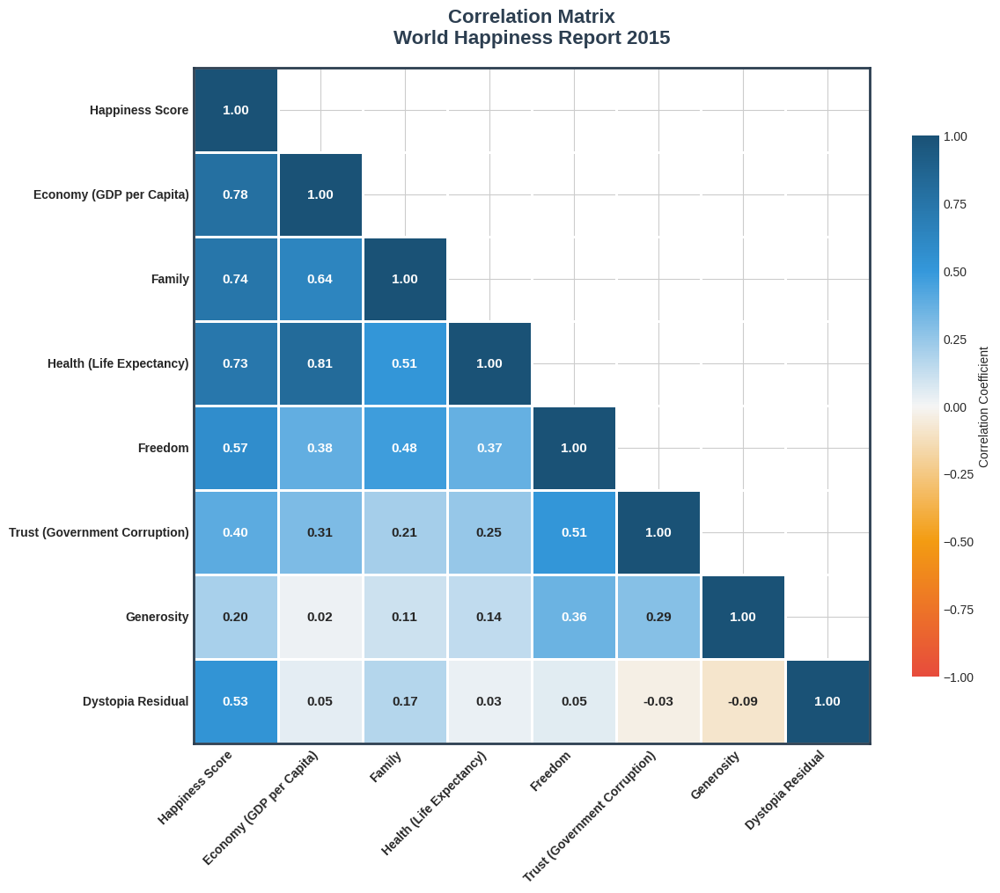

In [17]:

import seaborn as sns



factors = ['Happiness Score', 'Economy (GDP per Capita)', 'Family',
           'Health (Life Expectancy)', 'Freedom',
           'Trust (Government Corruption)', 'Generosity', 'Dystopia Residual']


corr = data[factors].corr()

fig, ax = plt.subplots(figsize=(12, 10))


colors = ['#e74c3c', '#f39c12', '#f5f5f5', '#3498db', '#1a5276']
cmap = sns.blend_palette(colors, as_cmap=True)


mask = np.triu(np.ones_like(corr, dtype=bool), k=1)


sns.heatmap(corr,
            mask=mask,
            annot=True,
            fmt='.2f',
            cmap=cmap,
            center=0,
            square=True,
            linewidths=2,
            linecolor='white',
            cbar_kws={'shrink': 0.8, 'label': 'Correlation Coefficient'},
            annot_kws={'size': 11, 'weight': 'bold'},
            vmin=-1, vmax=1)


plt.title('Correlation Matrix\nWorld Happiness Report 2015',
          fontsize=16, fontweight='bold', color='#2c3e50', pad=20)

plt.xticks(rotation=45, ha='right', fontsize=10, fontweight='bold')
plt.yticks(rotation=0, fontsize=10, fontweight='bold')


for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_color('#2c3e50')
    spine.set_linewidth(2)

plt.tight_layout()
plt.show()

### **Interpretation:**
Overall, money, health, and family matter most for happiness. **For example, Economy correlates with Happiness at 0.78, Family at 0.74, and Health at 0.73**, showing that richer countries with longer life expectancy and stronger family support are generally happier. Meanwhile, Freedom (0.57) and Trust in government (0.40) also contribute, but their effect is moderate. In contrast, Generosity has a very weak link (0.20) and barely impacts happiness. Furthermore, the Dystopia Residual (0.53) suggests that some happiness cannot be explained by these factors alone, meaning other elements also play a role.





### ***<font color="#FF69B4"><b><big>Horizontal bar chart</big></b></font>***

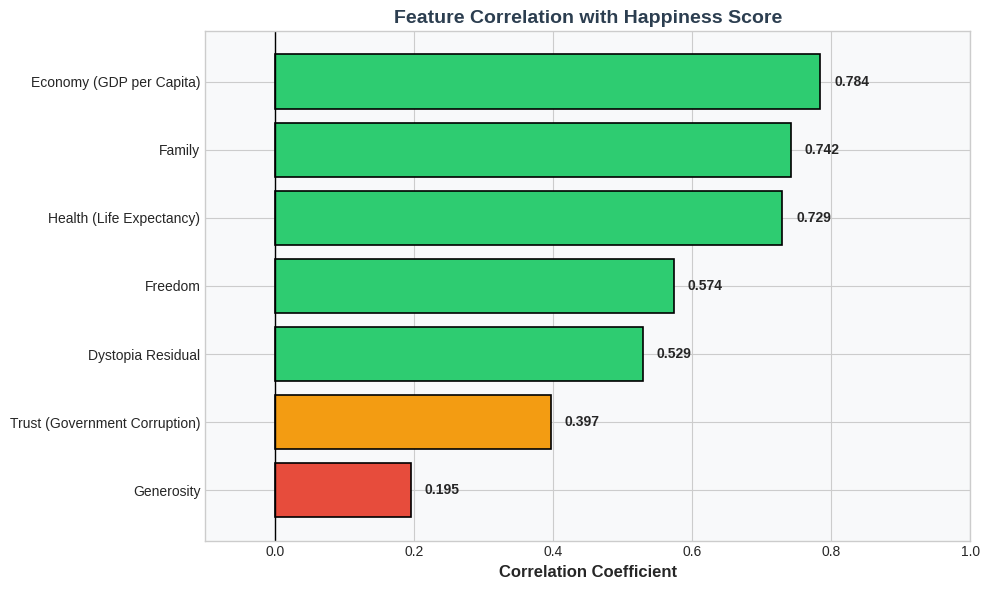

In [18]:
corr_happiness = data[factors].corr()['Happiness Score'].drop('Happiness Score').sort_values(ascending=True)

fig, ax = plt.subplots(figsize=(10, 6))

colors = ['#e74c3c' if x < 0.3 else '#f39c12' if x < 0.5 else '#2ecc71' for x in corr_happiness.values]

bars = ax.barh(corr_happiness.index, corr_happiness.values, color=colors, edgecolor='black', linewidth=1.2)


for bar, val in zip(bars, corr_happiness.values):
    ax.text(val + 0.02, bar.get_y() + bar.get_height()/2, f'{val:.3f}',
            va='center', fontsize=10, fontweight='bold')

ax.axvline(x=0, color='black', linewidth=1)
ax.set_xlabel('Correlation Coefficient', fontsize=12, fontweight='bold')
ax.set_title('Feature Correlation with Happiness Score', fontsize=14, fontweight='bold', color='#2c3e50')
ax.set_xlim(-0.1, 1.0)
ax.set_facecolor('#f8f9fa')

plt.tight_layout()
plt.show()

### **Interpretation:**

This shows that the main drivers of national happiness are **Economy (0.78), Family (0.74), and Health (0.73)**. Wealthier countries with strong family support and higher life expectancy tend to be much happier. **Freedom (0.57)** and **Dystopia Residual (0.53)** also contribute moderately, reflecting personal liberty and unexplained happiness, while **Trust (0.40)** has a smaller effect, showing that low corruption helps but isn’t a major factor. Finally, **Generosity (0.20)** has very little impact on overall happiness. In short, money, health, and family matter most, while generosity plays almost no role at the national level.



# <font color="#BBC863"><b><big>Feature Engineering</big></b></font>



### ***<font color="#F78D60"><b><big>1. Happiness Category</big></b></font>***

In [19]:
def categorize_happiness(score):
    if score >= 7.0:
        return 'Very Happy'
    elif score >= 6.0:
        return 'Happy'
    elif score >= 5.0:
        return 'Moderate'
    elif score >= 4.0:
        return 'Unhappy'
    else:
        return 'Very Unhappy'

data['Happiness_Category'] = data['Happiness Score'].apply(categorize_happiness)

print("Happiness Category Distribution:")
print(data['Happiness_Category'].value_counts())

Happiness Category Distribution:
Happiness_Category
Moderate        49
Unhappy         44
Happy           29
Very Unhappy    21
Very Happy      15
Name: count, dtype: int64


### **Interpretation:**

* Thresholds are based on the score range (2.8–7.6).
* 7.0 and above --> Very Happy
* 6.0 – 6.99 --> Happy
* 5.0 – 5.99 --> Moderate
* 4.0 – 4.99 --> Unhappy
* Below 4.0 --> Very Unhappy
* This groups countries meaningfully and makes patterns easier to see.
* Most countries fall in 'Moderate' or 'Unhappy', few are 'Very Happy'.


### ***<font color="#F78D60"><b><big>2. Regional Rank</big></b></font>***

In [20]:
data['Regional_Rank'] = data.groupby('Region')['Happiness Score'].rank(ascending=False, method='min').astype(int)

print("\nSample - Top country in each region:")
top_regional = data.loc[data.groupby('Region')['Regional_Rank'].idxmin()]
print(top_regional[['Country', 'Region', 'Regional_Rank', 'Happiness Score']])



Sample - Top country in each region:
           Country                           Region  Regional_Rank  \
8      New Zealand        Australia and New Zealand              1   
30  Czech Republic       Central and Eastern Europe              1   
37          Taiwan                     Eastern Asia              1   
11      Costa Rica      Latin America and Caribbean              1   
10          Israel  Middle East and Northern Africa              1   
4           Canada                    North America              1   
23       Singapore                Southeastern Asia              1   
78          Bhutan                    Southern Asia              1   
70       Mauritius               Sub-Saharan Africa              1   
0      Switzerland                   Western Europe              1   

    Happiness Score  
8             7.286  
30            6.505  
37            6.298  
11            7.226  
10            7.278  
4             7.427  
23            6.798  
78            5

### **Interpretation:**


Regional_Rank shows the ranking of countries within their own region based on happiness score. A rank of 1 means the country is the happiest in its region.

* Australia and New Zealand: New Zealand tops with 7.286.
* Central and Eastern Europe: Czech Republic tops with 6.505.
* Eastern Asia: Taiwan tops with 6.298.
* Latin America and Caribbean: Costa Rica tops with 7.226.
* Middle East and Northern Africa: Israel tops with 7.278.
* North America: Canada tops with 7.427.
* Southeastern Asia: Singapore tops with 6.798.
* Southern Asia: Bhutan tops with 5.253.
* Sub-Saharan Africa: Mauritius tops with 5.477.
* Western Europe: Switzerland tops with 7.587.

This feature helps to compare countries regionally, not just globally.



### ***<font color="#F78D60"><b><big>3. Dominant Factor</big></b></font>***

In [21]:
factors = ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
           'Freedom', 'Trust (Government Corruption)', 'Generosity']

data['Dominant_Factor'] = data[factors].idxmax(axis=1)

#cleaning names
data['Dominant_Factor'] = data['Dominant_Factor'].str.replace(' (GDP per Capita)', '', regex=False)
data['Dominant_Factor'] = data['Dominant_Factor'].str.replace(' (Life Expectancy)', '', regex=False)
data['Dominant_Factor'] = data['Dominant_Factor'].str.replace(' (Government Corruption)', '', regex=False)

print("\nDistribution of dominant factors:")
print(data['Dominant_Factor'].value_counts())


Distribution of dominant factors:
Dominant_Factor
Family        97
Economy       54
Freedom        4
Health         2
Generosity     1
Name: count, dtype: int64


### **Interpretation:**

* **Family** is the most common dominant factor, affecting **97 countries**.
* **Economy (GDP per Capita)** comes next, dominant in 54 countries.
* **Freedom** is dominant in 4 countries, **Health** in 2, and **Generosity** in 1.
* **Takeaway:** Social support (Family) and wealth (Economy) are the main drivers of happiness worldwide, while other factors have a smaller influence.



### ***<font color="#F78D60"><b><big>4. Total Factor Score</big></b></font>***

In [22]:
factors = ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
           'Freedom', 'Trust (Government Corruption)', 'Generosity']

data['Total_Factor_Score'] = data[factors].sum(axis=1)

print("Total_Factor_Score")
print(f"Range: {data['Total_Factor_Score'].min():.3f} to {data['Total_Factor_Score'].max():.3f}")
print(f"Mean: {data['Total_Factor_Score'].mean():.3f}")

Total_Factor_Score
Range: 1.072 to 5.070
Mean: 3.291


### **Interpretation:**

This score adds up all main factors that affect happiness (Economy, Family, Health, Freedom, Trust, Generosity). It shows the **overall strength of a country’s conditions** that make people happy.
* Scores range from **1.072 to 5.070**, with an average of **3.291**.
* A **higher score** indicates stronger overall conditions and a likely happier population.
* A **lower score** indicates weaker conditions and a likely less happy population.

So, it’s a single number that sums up everything important for happiness.


### ***<font color="#F78D60"><b><big>5. Factor Balance</big></b></font>***

In [23]:
factors = ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
           'Freedom', 'Trust (Government Corruption)', 'Generosity']

data['Factor_Balance'] = data[factors].std(axis=1)

print(f"Range: {data['Factor_Balance'].min():.3f} to {data['Factor_Balance'].max():.3f}")
print("\nMost balanced countries (lowest std):")
print(data.nsmallest(5, 'Factor_Balance')[['Country', 'Factor_Balance']])

Range: 0.097 to 0.560

Most balanced countries (lowest std):
         Country  Factor_Balance
152  Afghanistan        0.097432
157         Togo        0.099796
149       Guinea        0.127704
156      Burundi        0.137886
154        Benin        0.140125


### **Interpretation:**

 'Factor_Balance' measures how **evenly the 6 key happiness factors** (Economy, Family, Health, Freedom, Trust, Generosity) are distributed in a country.
* **Low value --> balanced**: all factors contribute **similarly**.
* **High value --> unbalanced**: some factors dominate, others are weak.

* Range in data: **0.097 to 0.560**.
* Most factor balanced countries: **Afghanistan, Togo, Guinea, Burundi, Benin**.

 **Important:** Balanced doesn’t mean happy i.e. a country like **Afghanistan** is balanced, but all its factors are **low**, so overall happiness is still low. In short, it shows **factor consistency**, not absolute happiness.


### ***<font color="#F78D60"><b><big>6. Material Score</big></b></font>***

In [24]:
data['Material_Score'] = data['Economy (GDP per Capita)'] + data['Health (Life Expectancy)']
print(f"Range: {data['Material_Score'].min():.3f} to {data['Material_Score'].max():.3f}")

Range: 0.145 to 2.547


### **Interpretation:**


'Material_Score' combines **Economy** and **Health** to represent a country’s **material or physical wellbeing**.
* **Higher score means better economic conditions and healthier population** --> likely contributes more to happiness.
* **Lower score means weaker economy or poor health** --> may limit overall happiness.
* In the dataset, scores **range from 0.145 to 2.547**, showing large differences between countries.

In short, it’s a **single number showing how strong a country is materially and health-wise**.




### ***<font color="#F78D60"><b><big>7. Social Score</big></b></font>***

In [25]:

data['Social_Score'] = (data['Family'] + data['Freedom'] +
                      data['Trust (Government Corruption)'] + data['Generosity'])


print(f"Range: {data['Social_Score'].min():.3f} to {data['Social_Score'].max():.3f}")

Range: 0.832 to 2.863


### **Interpretation:**


'Social_Score' combines **Family, Freedom, Trust, and Generosity** to measure a country’s **social wellbeing**.
* **Higher score means stronger social support, freedom, trust, and generosity** --> likely boosts happiness.
* **Lower score means weaker social conditions** --> may limit happiness.
* In this dataset, scores **range from 0.832 to 2.863**, showing differences in social wellbeing across countries.

In short, it’s a **single number showing how strong a country is socially**.


### ***<font color="#F78D60"><b><big>8. Material-Social Ratio</big></b></font>***

In [26]:

data['Material_Social_Ratio'] = data['Material_Score'] / (data['Social_Score'] + 0.001)

print(f"Range: {data['Material_Social_Ratio'].min():.3f} to {data['Material_Social_Ratio'].max():.3f}")
print(f"\nCountries with ratio > 1.0: {(data['Material_Social_Ratio'] > 1.0).sum()}")
print(f"Countries with ratio < 1.0: {(data['Material_Social_Ratio'] < 1.0).sum()}")

Range: 0.086 to 1.648

Countries with ratio > 1.0: 48
Countries with ratio < 1.0: 110


### **Interpretation:**


'Material_Social_Ratio' compares a country’s **material wellbeing** (Economy, Health) to its **social wellbeing** (Family, Freedom, Trust, Generosity).
* **Ratio > 1 means happiness relies more on material factors**.
* **Ratio < 1 means happiness relies more on social factors**.

In our dataset,

  * Range: **0.086 to 1.648**
  * **48 countries** are more material-focused
  * **110 countries** are more social-focused
* **Takeaway:** Most countries’ happiness depends **more on social factors** than material factors.


### ***<font color="#F78D60"><b><big>9. Democratic Index</big></b></font>***

In [27]:

data['Democratic_Index'] = data['Trust (Government Corruption)'] + data['Freedom']


print(f"Range: {data['Democratic_Index'].min():.3f} to {data['Democratic_Index'].max():.3f}")
print("\nTop 5 countries by Democratic Index:")
print(data.nlargest(5, 'Democratic_Index')[['Country', 'Democratic_Index', 'Trust (Government Corruption)', 'Freedom']])

Range: 0.091 to 1.162

Top 5 countries by Democratic Index:
         Country  Democratic_Index  Trust (Government Corruption)  Freedom
27         Qatar           1.16248                        0.52208  0.64040
153       Rwanda           1.14392                        0.55191  0.59201
2        Denmark           1.13295                        0.48357  0.64938
7         Sweden           1.09824                        0.43844  0.65980
0    Switzerland           1.08535                        0.41978  0.66557


### **Interpretation:**

The **Democratic Index** shows how strong a country’s **freedom and trust in government** are.
Scores go from **very low (0.091)** to **high (1.162)**.



* **Top countries:** Qatar, Rwanda, Denmark, Sweden, Switzerland.
* High scores indicate citizens feel freer and trust their government more.

**Takeaway:** Countries with higher democratic wellbeing tend to support greater happiness among their people.



### ***<font color="#F78D60"><b><big>10. Happiness Efficiency</big></b></font>***

In [28]:

data['Happiness_Efficiency'] = data['Happiness Score'] / (data['Economy (GDP per Capita)'] + 0.1)
print(f"Range: {data['Happiness_Efficiency'].min():.3f} to {data['Happiness_Efficiency'].max():.3f}")
print("\nMost efficient countries (high happiness, lower GDP):")
print(data.nlargest(5, 'Happiness_Efficiency')[['Country', 'Happiness Score', 'Economy (GDP per Capita)', 'Happiness_Efficiency']])

Range: 3.358 to 36.987

Most efficient countries (high happiness, lower GDP):
        Country  Happiness Score  Economy (GDP per Capita)  \
130      Malawi            4.292                   0.01604   
93   Mozambique            4.971                   0.08308   
115     Liberia            4.571                   0.07120   
156     Burundi            2.905                   0.01530   
143       Niger            3.845                   0.06940   

     Happiness_Efficiency  
130             36.987246  
93              27.152065  
115             26.699766  
156             25.195143  
143             22.697757  


### **Interpretation:**

'Happiness_Efficiency' measures how much **happiness a country achieves relative to its GDP wealth**.

* **High values** indicate countries that are relatively happy despite low GDP.
* **Low values** indicate countries with higher GDP but less happiness per economic unit.

**In this dataset:**

* Range: **3.358 to 36.987**
* Most efficient countries (high happiness, low GDP): **Malawi (36.99), Mozambique (27.15), Liberia (26.70), Burundi (25.20), Niger (22.70)**

**Takeaway:** Some low-GDP countries achieve relatively high happiness, showing that economic wealth alone does not fully determine wellbeing.



### ***<font color="#F78D60"><b><big>11. Health Efficiency</big></b></font>***

In [29]:
data['Health_Efficiency'] = data['Health (Life Expectancy)'] / (data['Economy (GDP per Capita)'] + 0.01)

print(f"Range: {data['Health_Efficiency'].min():.3f} to {data['Health_Efficiency'].max():.3f}")
print(f"Mean: {data['Health_Efficiency'].mean():.3f}")
print("\nTop 5 countries with best health relative to GDP:")
print(data.nlargest(5, 'Health_Efficiency')[['Country', 'Health (Life Expectancy)', 'Economy (GDP per Capita)', 'Health_Efficiency']])

Range: 0.048 to 8.852
Mean: 0.954

Top 5 countries with best health relative to GDP:
               Country  Health (Life Expectancy)  Economy (GDP per Capita)  \
156            Burundi                   0.22396                   0.01530   
130             Malawi                   0.22562                   0.01604   
115            Liberia                   0.34201                   0.07120   
143              Niger                   0.29707                   0.06940   
90   Somaliland region                   0.43873                   0.18847   

     Health_Efficiency  
156           8.852174  
130           8.664363  
115           4.211946  
143           3.741436  
90            2.210561  


### **Interpretation:**

**Health Efficiency** measures how much life expectancy a country achieves relative to its economic wealth.

* **High values** indicate countries with good health despite low GDP.
* **Low values** indicate countries with higher GDP but less health per economic unit.

**In this dataset:**

* Range: **0.048 to 8.852**, Mean: **0.954**
* Top performers: **Burundi, Malawi, Liberia, Niger, Somaliland region**

**Takeaway:** Some low-GDP countries maintain relatively good health compared to their wealth, showing that strong health outcomes are possible even with limited economic resources.


### ***<font color="#F78D60"><b><big>12. Corruption Impact</big></b></font>***

In [30]:
# Inverse of trust - shows negative impact of corruption
data['Corruption_Impact'] = 1 - data['Trust (Government Corruption)']

print("Feature: Corruption_Impact")
print(f"Range: {data['Corruption_Impact'].min():.3f} to {data['Corruption_Impact'].max():.3f}")
print(f"Mean: {data['Corruption_Impact'].mean():.3f}")
print("\nTop 5 most corruption-impacted countries:")
print(data.nlargest(5, 'Corruption_Impact')[['Country', 'Trust (Government Corruption)', 'Corruption_Impact']])

Feature: Corruption_Impact
Range: 0.448 to 0.998
Mean: 0.856

Top 5 most corruption-impacted countries:
                    Country  Trust (Government Corruption)  Corruption_Impact
95   Bosnia and Herzegovina                        0.00227            0.99773
85                  Romania                        0.00649            0.99351
133                Bulgaria                        0.00872            0.99128
55                Lithuania                        0.01031            0.98969
87                 Portugal                        0.01078            0.98922


### **Interpretation:**
**Corruption Impact** measures the negative effect of corruption in a country (calculated as 1 minus the trust in government).

* **Higher values** mean citizens perceive more corruption, which can lower happiness.
* **Lower values** mean higher trust in government and less corruption impact.

**In this dataset:**

* Range: **0.448 to 0.998**, Mean: **0.856**
* Most affected countries: **Bosnia and Herzegovina, Romania, Bulgaria, Lithuania, Portugal**

**Takeaway:** Countries with high corruption impact likely face challenges in governance and public trust, which can hinder overall happiness.


### ***<font color="#F78D60"><b><big>13. Freedom_Generosity_Interaction</big></b></font>***

In [31]:

data['Freedom_Generosity_Interaction'] = data['Freedom'] * data['Generosity']

print(f"Range: {data['Freedom_Generosity_Interaction'].min():.3f} to {data['Freedom_Generosity_Interaction'].max():.3f}")
print(f"Mean: {data['Freedom_Generosity_Interaction'].mean():.3f}")
print("\nTop 5 countries with highest freedom-generosity synergy:")
print(data.nlargest(5, 'Freedom_Generosity_Interaction')[['Country', 'Freedom', 'Generosity', 'Freedom_Generosity_Interaction']])

Range: 0.001 to 0.312
Mean: 0.109

Top 5 countries with highest freedom-generosity synergy:
           Country  Freedom  Generosity  Freedom_Generosity_Interaction
36           Malta  0.60365     0.51752                        0.312401
20  United Kingdom  0.59625     0.51912                        0.309525
8      New Zealand  0.63938     0.47501                        0.303712
33        Thailand  0.55664     0.54200                        0.301699
6      Netherlands  0.61576     0.47610                        0.293163


### **Interpretation:**

The **Freedom-Generosity Interaction** captures how freedom and generosity together contribute to a country’s happiness.

* It’s a **multiplicative measure**, so countries score high only if both freedom and generosity are strong. The multiplication creates an interaction term useful in machine learning
* **Higher values** indicate a strong synergy between personal freedom and social generosity, which likely boosts overall happiness.

**In this dataset:**

* Range: **0.001 to 0.312**, Mean: **0.109**
* Top countries: **Netherlands, Thailand, Malta, United Kingdom, New Zealand**

**Takeaway:** Countries where people enjoy both freedom and generosity tend to have happier and more socially cohesive societies.


### ***<font color="#F78D60"><b><big>14. Composite_Wellbeing_Index</big></b></font>***

In [32]:
data['Composite_Wellbeing_Index'] = (
    0.3 * data['Economy (GDP per Capita)'] +
    0.3 * data['Health (Life Expectancy)'] +
    0.2 * data['Family'] +
    0.2 * data['Freedom']
)

print(f"Range: {data['Composite_Wellbeing_Index'].min():.3f} to {data['Composite_Wellbeing_Index'].max():.3f}")
print(f"Mean: {data['Composite_Wellbeing_Index'].mean():.3f}")
print("\nTop 5 countries by composite wellbeing:")
print(data.nlargest(5, 'Composite_Wellbeing_Index')[['Country', 'Composite_Wellbeing_Index', 'Economy (GDP per Capita)', 'Health (Life Expectancy)']])

Range: 0.179 to 1.112
Mean: 0.730

Top 5 countries by composite wellbeing:
        Country  Composite_Wellbeing_Index  Economy (GDP per Capita)  \
16   Luxembourg                   1.111947                   1.56391   
0   Switzerland                   1.104398                   1.39651   
3        Norway                   1.103399                   1.45900   
27        Qatar                   1.090125                   1.69042   
1       Iceland                   1.081248                   1.30232   

    Health (Life Expectancy)  
16                   0.91894  
0                    0.94143  
3                    0.88521  
27                   0.79733  
1                    0.94784  


### **Interpretation:**
**Interpretation:**
The **Composite Wellbeing Index** combines key factors such as **Economy (30%)**, **Health (30%)**, **Family (20%)**, and **Freedom (20%)** to give a weighted view of a country’s overall wellbeing.

* Unlike the Total_Factor_Score, which treats all factors equally, this index emphasizes **material factors** (economy and health) slightly more, reflecting their stronger influence on measurable wellbeing.
* **Range:** 0.179 to 1.112, **Mean:** 0.730.

**Top countries:** Luxembourg, Switzerland, Norway, Qatar, and Iceland, showing strong economies and healthy populations.

**Takeaway:** Countries scoring high here combine wealth, health, family support, and freedom in a balanced way, indicating stronger overall wellbeing.


### ***<font color="#F78D60"><b><big>15. Economic Stress Index</big></b></font>***

In [33]:
data['Economic_Stress_Index'] = 1 / (data['Economy (GDP per Capita)'] + 0.1)

print(f"Range: {data['Economic_Stress_Index'].min():.3f} to {data['Economic_Stress_Index'].max():.3f}")
print(f"Mean: {data['Economic_Stress_Index'].mean():.3f}")
print("\nTop 5 countries with highest economic stress:")
print(data.nlargest(5, 'Economic_Stress_Index')[['Country', 'Economy (GDP per Capita)', 'Economic_Stress_Index']])

Range: 0.559 to 8.673
Mean: 1.473

Top 5 countries with highest economic stress:
                      Country  Economy (GDP per Capita)  Economic_Stress_Index
156                   Burundi                   0.01530               8.673027
130                    Malawi                   0.01604               8.617718
143                     Niger                   0.06940               5.903188
115                   Liberia                   0.07120               5.841121
147  Central African Republic                   0.07850               5.602241


### **Interpretation:**

The **Economic Stress Index** measures economic hardship by taking the inverse of GDP per capita.

* **Higher values** mean **lower GDP**, indicating countries under greater economic stress or poverty.
* **Range:** 0.559 to 8.673, **Mean:** 1.473.
* **Top stressed countries:** Burundi, Malawi, Niger, Liberia, and the Central African Republic, all with very low GDP per capita.

**Takeaway:** This feature gives a perspective opposite to GDP—highlighting countries most vulnerable economically rather than those that are wealthy.


### ***<font color="#F78D60"><b><big>16. Standard Error Weight</big></b></font>***

In [34]:
data['Reliability_Score'] = 1 / (data['Standard Error'] + 0.001)
print(f"Range: {data['Reliability_Score'].min():.3f} to {data['Reliability_Score'].max():.3f}")
print("Higher = more reliable happiness measurement")

Range: 7.250 to 51.335
Higher = more reliable happiness measurement


### **Interpretation:**
**Interpretation:**

The 'Reliability_Score' measures how trustworthy a country’s happiness data is. Higher values mean lower standard error, so the reported happiness score is more reliable. Lower values indicate less confidence in the measurement.


### ***<font color="#F78D60"><b><big>17. Economic Dependency Percentage</big></b></font>***

In [35]:
data['Economic_Dependency_Pct'] = (data['Economy (GDP per Capita)'] / data['Total_Factor_Score']) * 100

print(f"Range: {data['Economic_Dependency_Pct'].min():.1f}% to {data['Economic_Dependency_Pct'].max():.1f}%")
print(f"Mean: {data['Economic_Dependency_Pct'].mean():.1f}%")
print("\nTop 5 most economically dependent countries:")
print(data.nlargest(5, 'Economic_Dependency_Pct')[['Country', 'Economy (GDP per Capita)', 'Total_Factor_Score', 'Economic_Dependency_Pct']])

Range: 1.1% to 36.6%
Mean: 24.5%

Top 5 most economically dependent countries:
          Country  Economy (GDP per Capita)  Total_Factor_Score  \
142         Gabon                   1.06024             2.89751   
136        Angola                   0.75778             2.08351   
61        Croatia                   1.08254             3.00440   
38         Kuwait                   1.55422             4.41844   
34   Saudi Arabia                   1.39541             3.97237   

     Economic_Dependency_Pct  
142                36.591418  
136                36.370356  
61                 36.031820  
38                 35.175763  
34                 35.127896  


### **Interpretation:**

The **Economic Dependency Percentage** shows how much of a country’s overall happiness comes from its economy (GDP per capita).

* **Higher values** (~35–36%) mean happiness relies heavily on wealth, these countries are more vulnerable to economic changes.
* **Lower values** (~1–2%) mean happiness depends more on other factors like family, health, freedom, or social support.
* **Mean:** 24.5%, showing that on average, about a quarter of happiness comes from economic factors.
* **Top economically dependent countries:** Gabon, Angola, Croatia, Kuwait, and Saudi Arabia.

**Takeaway:** This helps identify countries where economic prosperity is crucial for happiness versus those with more balanced, resilient sources of wellbeing.


### ***<font color="#F78D60"><b><big>18. Regional Deviation</big></b></font>***

In [36]:
regional_mean = data.groupby('Region')['Happiness Score'].transform('mean')
data['Regional_Deviation'] = data['Happiness Score'] - regional_mean

positive_dev = data[data['Regional_Deviation'] > 0][['Country', 'Region', 'Happiness Score', 'Regional_Deviation']] \
                .sort_values(by='Regional_Deviation', ascending=False)

negative_dev = data[data['Regional_Deviation'] < 0][['Country', 'Region', 'Happiness Score', 'Regional_Deviation']] \
                .sort_values(by='Regional_Deviation')

print(positive_dev.to_string(index=False))
print(negative_dev.to_string(index=False))


             Country                          Region  Happiness Score  Regional_Deviation
              Israel Middle East and Northern Africa            7.278            1.871100
United Arab Emirates Middle East and Northern Africa            6.901            1.494100
           Singapore               Southeastern Asia            6.798            1.480556
                Oman Middle East and Northern Africa            6.853            1.446100
           Mauritius              Sub-Saharan Africa            5.477            1.274200
               Qatar Middle East and Northern Africa            6.611            1.204100
      Czech Republic      Central and Eastern Europe            6.505            1.172069
            Thailand               Southeastern Asia            6.455            1.137556
          Costa Rica     Latin America and Caribbean            7.226            1.081318
             Nigeria              Sub-Saharan Africa            5.268            1.065200
          

### **Interpretation:**
This measures how a country’s happiness score compares to the **average happiness of its own region**.

* **Positive deviation**: Country is happier than the regional average.

  * Example: Israel (+1.87), UAE(+1.49), Singapore (+1.48) are significantly above their regional averages.
* **Negative deviation**: Country is less happy than the regional average.

  * Example: Syria (-2.40) and Greece (-1.83) fall well below their regional averages.

**Takeaway**:
This feature highlights which countries are **outperforming or underperforming** relative to their neighbors. It helps identify regional leaders and laggards in happiness, independent of global rankings.



# <font color="#E5989B"><b><big>Visualizations</big></b></font>



### ***<font color="#C890A7"><b><big>1. Ridgeline Plot</big></b></font>***

In [37]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
import pandas as pd
import scipy.stats as stats

region_stats = data.groupby('Region')['Composite_Wellbeing_Index'].agg(['median', 'mean', 'std', 'count', 'min', 'max'])
region_stats = region_stats.sort_values('median', ascending=False)
regions = region_stats.index.tolist()

global_median = data['Composite_Wellbeing_Index'].median()
global_mean = data['Composite_Wellbeing_Index'].mean()
global_q25 = data['Composite_Wellbeing_Index'].quantile(0.25)
global_q75 = data['Composite_Wellbeing_Index'].quantile(0.75)

palette = {
    'dark_green': '#3D5A47',
    'olive': '#4A5240',
    'teal': '#4A6670',
    'bronze': '#A67C52',
    'cream': '#E8E4D9',
    'border': '#2C3E35'
}

def get_color_by_median(median_val):
    med_max = region_stats['median'].max()
    med_min = region_stats['median'].min()
    normalized = (median_val - med_min) / (med_max - med_min) if med_max != med_min else 0.5

    if normalized >= 0.8:
        return palette['dark_green'], 'Very High Wellbeing'
    elif normalized >= 0.6:
        return palette['olive'], 'High Wellbeing'
    elif normalized >= 0.4:
        return palette['teal'], 'Moderate Wellbeing'
    elif normalized >= 0.2:
        return palette['bronze'], 'Low Wellbeing'
    else:
        return '#8B6914', 'Very Low Wellbeing'

def hex_to_rgba(hex_color, alpha=0.5):
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16)
    g = int(hex_color[2:4], 16)
    b = int(hex_color[4:6], 16)
    return f'rgba({r},{g},{b},{alpha})'

fig = make_subplots(
    rows=len(regions), cols=1,
    shared_xaxes=True,
    vertical_spacing=0.008,
    subplot_titles=[None for _ in regions],
    row_heights=[1] * len(regions)
)

legend_items = set()

x_min_global = data['Composite_Wellbeing_Index'].min()
x_max_global = data['Composite_Wellbeing_Index'].max()
x_padding = (x_max_global - x_min_global) * 0.15
x_range_start = x_min_global - x_padding
x_range_end = x_max_global + x_padding

for idx, region in enumerate(regions, start=1):
    region_data = data[data['Region'] == region]['Composite_Wellbeing_Index'].values

    median_val = region_stats.loc[region, 'median']
    mean_val = region_stats.loc[region, 'mean']
    std_val = region_stats.loc[region, 'std']
    min_val = region_stats.loc[region, 'min']
    max_val = region_stats.loc[region, 'max']
    count_val = int(region_stats.loc[region, 'count'])

    color, category = get_color_by_median(median_val)

    x_range = np.linspace(x_range_start, x_range_end, 300)

    if len(region_data) >= 2 and std_val > 0:
        kde = stats.gaussian_kde(region_data, bw_method=0.35)
        density = kde(x_range)
        density_normalized = density / density.max() if density.max() > 0 else density
    else:
        density_normalized = np.zeros_like(x_range)
        if len(region_data) == 1:
            closest_idx = np.argmin(np.abs(x_range - region_data[0]))
            density_normalized[closest_idx] = 1

    country_info = data[data['Region'] == region][['Country', 'Composite_Wellbeing_Index']].sort_values('Composite_Wellbeing_Index')
    countries_list = "<br>".join([f"{row['Country']}: {row['Composite_Wellbeing_Index']:.2f}"
                                   for _, row in country_info.iterrows()])

    show_legend = category not in legend_items
    legend_items.add(category)

    fig.add_trace(
        go.Scatter(
            x=x_range,
            y=density_normalized,
            fill='tozeroy',
            fillcolor=hex_to_rgba(color, 0.45),
            line=dict(color=palette['border'], width=2.5),
            mode='lines',
            name=category,
            legendgroup=category,
            showlegend=show_legend,
            hovertemplate=(
                f"<b>{region}</b><br>" +
                f"Wellbeing Index: %{{x:.2f}}<br>" +
                f"Density: %{{y:.2f}}<br>" +
                f"<br><b>Statistics:</b><br>" +
                f"Mean: {mean_val:.2f}<br>" +
                f"Median: {median_val:.2f}<br>" +
                f"Std Dev: {std_val:.2f}<br>" +
                f"Range: {min_val:.2f} - {max_val:.2f}<br>" +
                f"Countries: {count_val}<br>" +
                f"<br><b>All Countries:</b><br>{countries_list}" +
                "<extra></extra>"
            ),
            opacity=0.9
        ),
        row=idx, col=1
    )

    for _, country_row in data[data['Region'] == region].iterrows():
        fig.add_trace(
            go.Scatter(
                x=[country_row['Composite_Wellbeing_Index']],
                y=[0.08],
                mode='markers',
                marker=dict(
                    size=10,
                    color=hex_to_rgba(color, 0.8),
                    line=dict(color=palette['border'], width=2),
                    symbol='diamond'
                ),
                name=country_row['Country'],
                legendgroup='countries',
                showlegend=False,
                hovertemplate=(
                    f"<b>{country_row['Country']}</b><br>" +
                    f"Composite Wellbeing: {country_row['Composite_Wellbeing_Index']:.2f}<br>" +
                    f"Region: {region}<br>" +
                    f"<br><b>Factor Breakdown:</b><br>" +
                    f"Material Score: {country_row['Material_Score']:.2f}<br>" +
                    f"Social Score: {country_row['Social_Score']:.2f}<br>" +
                    f"Democratic Index: {country_row['Democratic_Index']:.2f}<br>" +
                    f"Happiness Efficiency: {country_row['Happiness_Efficiency']:.2f}<br>" +
                    f"Economic Stress: {country_row['Economic_Stress_Index']:.2f}<br>" +
                    f"Reliability Score: {country_row['Reliability_Score']:.2f}<br>" +
                    "<extra></extra>"
                )
            ),
            row=idx, col=1
        )

    fig.add_trace(
        go.Scatter(
            x=[median_val, median_val],
            y=[0, 1.15],
            mode='lines',
            line=dict(color=palette['dark_green'], width=4, dash='solid'),
            name='Median' if idx == 1 else None,
            legendgroup='median',
            showlegend=(idx == 1),
            opacity=0.85,
            hovertemplate=f"<b>Median: {median_val:.2f}</b><extra></extra>"
        ),
        row=idx, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=[mean_val, mean_val],
            y=[0, 1.15],
            mode='lines',
            line=dict(color=palette['bronze'], width=3.5, dash='dash'),
            name='Mean' if idx == 1 else None,
            legendgroup='mean',
            showlegend=(idx == 1),
            opacity=0.85,
            hovertemplate=f"<b>Mean: {mean_val:.2f}</b><extra></extra>"
        ),
        row=idx, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=[global_median, global_median],
            y=[0, 1.15],
            mode='lines',
            line=dict(color=palette['border'], width=3, dash='dot'),
            name=f'Global Median ({global_median:.2f})' if idx == 1 else None,
            legendgroup='global',
            showlegend=(idx == 1),
            opacity=0.7,
            hovertemplate=f"<b>Global Median: {global_median:.2f}</b><extra></extra>"
        ),
        row=idx, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=[min_val, max_val],
            y=[0, 0],
            mode='lines',
            line=dict(color=palette['border'], width=5),
            name='Range' if idx == 1 else None,
            legendgroup='range',
            showlegend=(idx == 1),
            opacity=0.9,
            hovertemplate=f"<b>Range: {min_val:.2f} to {max_val:.2f}</b><extra></extra>"
        ),
        row=idx, col=1
    )

    q25 = np.percentile(region_data, 25)
    q75 = np.percentile(region_data, 75)

    fig.add_trace(
        go.Scatter(
            x=[q25, q25],
            y=[0, 0.55],
            mode='lines',
            line=dict(color=palette['teal'], width=2.5, dash='dashdot'),
            name='Q25' if idx == 1 else None,
            legendgroup='q25',
            showlegend=(idx == 1),
            opacity=0.75,
            hovertemplate=f"<b>25th Percentile: {q25:.2f}</b><extra></extra>"
        ),
        row=idx, col=1
    )

    fig.add_trace(
        go.Scatter(
            x=[q75, q75],
            y=[0, 0.55],
            mode='lines',
            line=dict(color=palette['olive'], width=2.5, dash='dashdot'),
            name='Q75' if idx == 1 else None,
            legendgroup='q75',
            showlegend=(idx == 1),
            opacity=0.75,
            hovertemplate=f"<b>75th Percentile: {q75:.2f}</b><extra></extra>"
        ),
        row=idx, col=1
    )

    fig.add_annotation(
        x=x_range_start + 0.01,
        y=0.55,
        text=f"<b>{region}</b><br><span style='font-size:10px'>n={count_val}</span>",
        showarrow=False,
        font=dict(size=12, color=palette['border'], family='Arial'),
        bgcolor=hex_to_rgba(palette['cream'], 0.95),
        bordercolor=color,
        borderwidth=3,
        borderpad=6,
        xref=f'x{idx}' if idx > 1 else 'x',
        yref=f'y{idx}' if idx > 1 else 'y',
        xanchor='left'
    )

    fig.add_annotation(
        x=x_range_end - 0.01,
        y=0.55,
        text=f"<b>M={median_val:.2f}</b><br><span style='font-size:10px'>SD={std_val:.2f}</span>",
        showarrow=False,
        font=dict(size=11, color=palette['dark_green'], family='Arial'),
        bgcolor=hex_to_rgba(palette['cream'], 0.95),
        bordercolor=color,
        borderwidth=3,
        borderpad=5,
        xref=f'x{idx}' if idx > 1 else 'x',
        yref=f'y{idx}' if idx > 1 else 'y',
        xanchor='right'
    )

    fig.update_xaxes(
        range=[x_range_start, x_range_end],
        showgrid=True,
        gridcolor=hex_to_rgba(palette['border'], 0.15),
        gridwidth=1,
        row=idx, col=1
    )
    fig.update_yaxes(
        range=[-0.12, 1.25],
        showticklabels=False,
        showgrid=False,
        row=idx, col=1
    )

fig.update_layout(
    title=dict(
        text=(
            "<b>Composite Wellbeing Index Distribution by Region</b><br>" +
            f"<span style='font-size:14px; color:{palette['teal']}'>Comparing {len(data)} countries across {len(regions)} regions | " +
            f"Global median: {global_median:.2f} | Ranked by regional median</span>"
        ),
        x=0.5,
        xanchor='center',
        font=dict(size=24, color=palette['border'], family='Arial Black')
    ),
    height=200 * len(regions),
    showlegend=True,
    legend=dict(
        title=dict(text="<b>Legend</b>", font=dict(size=14, color=palette['border'], family='Arial Black')),
        x=1.02,
        y=0.5,
        xanchor='left',
        yanchor='middle',
        bgcolor=hex_to_rgba(palette['cream'], 0.98),
        bordercolor=palette['border'],
        borderwidth=3,
        font=dict(size=11, color=palette['border'], family='Arial'),
        itemsizing='constant'
    ),
    plot_bgcolor=palette['cream'],
    paper_bgcolor=palette['cream'],
    hovermode='closest',
    margin=dict(l=80, r=200, t=110, b=100)
)

fig.update_xaxes(
    title_text="<b>Composite Wellbeing Index</b>",
    title_font=dict(size=15, color=palette['border'], family='Arial Black'),
    tickfont=dict(size=12, color=palette['border']),
    row=len(regions), col=1
)

sorted_by_std = region_stats.sort_values('std')
most_consistent = sorted_by_std.index[0]
most_varied = sorted_by_std.index[-1]

fig.add_annotation(
    text=(
        f"<b>Key Insights</b><br>" +
        f"<span style='color:{palette['dark_green']}'>Highest: {regions[0]}</span><br>" +
        f"M = {region_stats.loc[regions[0], 'median']:.2f}<br>" +
        f"<span style='color:{palette['bronze']}'>Lowest: {regions[-1]}</span><br>" +
        f"M = {region_stats.loc[regions[-1], 'median']:.2f}<br>" +
        f"Gap: {region_stats.loc[regions[0], 'median'] - region_stats.loc[regions[-1], 'median']:.2f} pts"
    ),
    xref='paper', yref='paper',
    x=1.02, y=0.18,
    xanchor='left', yanchor='top',
    showarrow=False,
    font=dict(size=11, color=palette['border'], family='Arial'),
    bgcolor=hex_to_rgba(palette['cream'], 0.98),
    bordercolor=palette['bronze'],
    borderwidth=3,
    borderpad=12,
    align='left'
)

fig.add_annotation(
    text=(
        f"<b>Consistency</b><br>" +
        f"<span style='color:{palette['teal']}'>Most: {most_consistent[:15]}...</span><br>" +
        f"SD = {region_stats.loc[most_consistent, 'std']:.2f}<br>" +
        f"<span style='color:{palette['olive']}'>Least: {most_varied[:15]}...</span><br>" +
        f"SD = {region_stats.loc[most_varied, 'std']:.2f}"
    ),
    xref='paper', yref='paper',
    x=1.02, y=0.02,
    xanchor='left', yanchor='bottom',
    showarrow=False,
    font=dict(size=11, color=palette['border'], family='Arial'),
    bgcolor=hex_to_rgba(palette['cream'], 0.98),
    bordercolor=palette['teal'],
    borderwidth=3,
    borderpad=12,
    align='left'
)

fig.show()

print("COMPOSITE WELLBEING INDEX - STATISTICAL SUMMARY")
print("=" * 100)
print(f"\n{'Region':<35} {'N':>5} {'Min':>8} {'Q25':>8} {'Median':>8} {'Q75':>8} {'Max':>8} {'Mean':>8} {'Std':>8}")
print("-" * 100)

for region in regions:
    region_data = data[data['Region'] == region]['Composite_Wellbeing_Index']
    n = len(region_data)
    min_val = region_data.min()
    q25 = region_data.quantile(0.25)
    median_val = region_data.median()
    q75 = region_data.quantile(0.75)
    max_val = region_data.max()
    mean_val = region_data.mean()
    std_val = region_data.std()

    print(f"{region:<35} {n:>5} {min_val:>8.2f} {q25:>8.2f} {median_val:>8.2f} {q75:>8.2f} {max_val:>8.2f} {mean_val:>8.2f} {std_val:>8.2f}")

print("-" * 100)
print(f"{'GLOBAL':<35} {len(data):>5} {data['Composite_Wellbeing_Index'].min():>8.2f} {global_q25:>8.2f} {global_median:>8.2f} {global_q75:>8.2f} {data['Composite_Wellbeing_Index'].max():>8.2f} {global_mean:>8.2f} {data['Composite_Wellbeing_Index'].std():>8.2f}")

COMPOSITE WELLBEING INDEX - STATISTICAL SUMMARY

Region                                  N      Min      Q25   Median      Q75      Max     Mean      Std
----------------------------------------------------------------------------------------------------
Australia and New Zealand               2     1.04     1.05     1.06     1.06     1.07     1.06     0.02
North America                           2     1.04     1.04     1.05     1.05     1.06     1.05     0.02
Western Europe                         21     0.81     1.01     1.05     1.06     1.11     1.02     0.07
Eastern Asia                            6     0.78     0.83     0.93     1.01     1.05     0.92     0.11
Latin America and Caribbean            22     0.39     0.75     0.81     0.89     0.92     0.80     0.12
Central and Eastern Europe             29     0.55     0.73     0.77     0.86     0.99     0.78     0.11
Middle East and Northern Africa        20     0.49     0.65     0.77     0.96     1.09     0.79     0.18
Southeaste

### ***<font color="#C890A7"><b><big>2. Lollipop Chart</big></b></font>***

In [38]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np

top_10 = data.nsmallest(10, 'Happiness Rank')[['Country', 'Happiness Score', 'Region', 'Happiness Rank']]
bottom_10 = data.nlargest(10, 'Happiness Rank')[['Country', 'Happiness Score', 'Region', 'Happiness Rank']]

mean_score = data['Happiness Score'].mean()

top_10['Deviation'] = top_10['Happiness Score'] - mean_score
bottom_10['Deviation'] = bottom_10['Happiness Score'] - mean_score

combined = pd.concat([top_10, bottom_10]).sort_values('Happiness Score', ascending=True).reset_index(drop=True)

fig = go.Figure()

happiest_countries = combined[combined['Deviation'] > 0]
unhappiest_countries = combined[combined['Deviation'] < 0]

frames_list = []
steps = 40

for i in range(steps + 1):
    t = i / steps
    factor = 0.5 * (1 - np.cos(np.pi * t))

    marker_size_unhappy = 12 + 6 * factor
    marker_size_happy = 12 + 6 * factor
    line_width_outer = 6 + 2 * factor
    line_width_inner = 4 + 1 * factor

    fdata = []

    for _, r in unhappiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#740938", width=line_width_outer),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in happiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#3B1C32", width=line_width_outer),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in unhappiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#D91656", width=line_width_inner),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in happiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#4C4B16", width=line_width_inner),
            hoverinfo="skip",
            showlegend=False
        ))

    fdata.append(go.Scatter(
        x=unhappiest_countries["Deviation"] * factor,
        y=unhappiest_countries["Country"],
        mode="markers",
        marker=dict(size=marker_size_unhappy, color='#D91656', line=dict(color='#740938', width=3)),
        showlegend=False
    ))
    fdata.append(go.Scatter(
        x=happiest_countries["Deviation"] * factor,
        y=happiest_countries["Country"],
        mode="markers",
        marker=dict(size=marker_size_happy, color='#4C4B16', line=dict(color='#3B1C32', width=3)),
        showlegend=False
    ))

    frames_list.append(go.Frame(data=fdata, name=f"f{i}"))

for i in range(steps + 1):
    t = i / steps
    factor = 1 - 0.5 * (1 - np.cos(np.pi * t))

    marker_size_unhappy = 18 - 6 * (1 - factor)
    marker_size_happy = 18 - 6 * (1 - factor)
    line_width_outer = 8 - 2 * (1 - factor)
    line_width_inner = 5 - 1 * (1 - factor)

    fdata = []

    for _, r in unhappiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#740938", width=line_width_outer),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in happiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#3B1C32", width=line_width_outer),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in unhappiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#D91656", width=line_width_inner),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in happiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"] * factor],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#4C4B16", width=line_width_inner),
            hoverinfo="skip",
            showlegend=False
        ))

    fdata.append(go.Scatter(
        x=unhappiest_countries["Deviation"] * factor,
        y=unhappiest_countries["Country"],
        mode="markers",
        marker=dict(size=marker_size_unhappy, color='#D91656', line=dict(color='#740938', width=3)),
        showlegend=False
    ))
    fdata.append(go.Scatter(
        x=happiest_countries["Deviation"] * factor,
        y=happiest_countries["Country"],
        mode="markers",
        marker=dict(size=marker_size_happy, color='#4C4B16', line=dict(color='#3B1C32', width=3)),
        showlegend=False
    ))

    frames_list.append(go.Frame(data=fdata, name=f"r{i}"))

for i in range(20):
    t = i / 20
    pulse = 1 + 0.08 * np.sin(2 * np.pi * t)

    marker_size = 18 * pulse
    line_outer = 8 * pulse
    line_inner = 5 * pulse

    fdata = []

    for _, r in unhappiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"]],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#740938", width=line_outer),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in happiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"]],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#3B1C32", width=line_outer),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in unhappiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"]],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#D91656", width=line_inner),
            hoverinfo="skip",
            showlegend=False
        ))
    for _, r in happiest_countries.iterrows():
        fdata.append(go.Scatter(
            x=[0, r["Deviation"]],
            y=[r["Country"], r["Country"]],
            mode="lines",
            line=dict(color="#4C4B16", width=line_inner),
            hoverinfo="skip",
            showlegend=False
        ))

    fdata.append(go.Scatter(
        x=unhappiest_countries["Deviation"],
        y=unhappiest_countries["Country"],
        mode="markers",
        marker=dict(size=marker_size, color='#D91656', line=dict(color='#740938', width=3)),
        showlegend=False
    ))
    fdata.append(go.Scatter(
        x=happiest_countries["Deviation"],
        y=happiest_countries["Country"],
        mode="markers",
        marker=dict(size=marker_size, color='#4C4B16', line=dict(color='#3B1C32', width=3)),
        showlegend=False
    ))

    frames_list.append(go.Frame(data=fdata, name=f"p{i}"))

fig.frames = frames_list

for _, row in unhappiest_countries.iterrows():
    fig.add_trace(go.Scatter(x=[0, row['Deviation']], y=[row['Country'], row['Country']], mode='lines', line=dict(color='#740938', width=8), showlegend=False, hoverinfo='skip'))
for _, row in happiest_countries.iterrows():
    fig.add_trace(go.Scatter(x=[0, row['Deviation']], y=[row['Country'], row['Country']], mode='lines', line=dict(color='#3B1C32', width=8), showlegend=False, hoverinfo='skip'))
for _, row in unhappiest_countries.iterrows():
    fig.add_trace(go.Scatter(x=[0, row['Deviation']], y=[row['Country'], row['Country']], mode='lines', line=dict(color='#D91656', width=5), showlegend=False, hoverinfo='skip'))
for _, row in happiest_countries.iterrows():
    fig.add_trace(go.Scatter(x=[0, row['Deviation']], y=[row['Country'], row['Country']], mode='lines', line=dict(color='#4C4B16', width=5), showlegend=False, hoverinfo='skip'))

fig.add_trace(go.Scatter(
    x=unhappiest_countries['Deviation'],
    y=unhappiest_countries['Country'],
    mode='markers',
    marker=dict(size=18, color='#D91656', line=dict(color='#740938', width=3)),
    name='UNHAPPIEST (Bottom 10)',
    legendgroup='below',
    hovertemplate='<b>%{y}</b><br>Happiness Score: %{customdata[0]:.3f}<br>Deviation: %{x:.3f}<br>Rank: #%{customdata[1]}<br>Region: %{customdata[2]}<br><extra></extra>',
    customdata=unhappiest_countries[['Happiness Score', 'Happiness Rank', 'Region']].values
))

fig.add_trace(go.Scatter(
    x=happiest_countries['Deviation'],
    y=happiest_countries['Country'],
    mode='markers',
    marker=dict(size=18, color='#4C4B16', line=dict(color='#3B1C32', width=3)),
    name='HAPPIEST (Top 10)',
    legendgroup='above',
    hovertemplate='<b>%{y}</b><br>Happiness Score: %{customdata[0]:.3f}<br>Deviation: %{x:.3f}<br>Rank: #%{customdata[1]}<br>Region: %{customdata[2]}<br><extra></extra>',
    customdata=happiest_countries[['Happiness Score', 'Happiness Rank', 'Region']].values
))

for _, row in combined.iterrows():
    color = '#4C4B16' if row['Deviation'] > 0 else '#D91656'
    border_color = '#3B1C32' if row['Deviation'] > 0 else '#740938'
    fig.add_annotation(
        x=row['Deviation'],
        y=row['Country'],
        text=f"<b>{row['Happiness Score']:.2f}</b>",
        showarrow=False,
        font=dict(size=12, color='white', family='Arial'),
        bgcolor=color,
        borderpad=5,
        borderwidth=2,
        bordercolor=border_color,
        opacity=0.95,
        xshift=25 if row['Deviation'] > 0 else -25
    )

fig.add_vline(
    x=0,
    line=dict(color='#EB5B00', width=3),
    annotation=dict(text=f"Global Mean: {mean_score:.2f}", font=dict(size=13, color='white', family='Arial Black'), bgcolor='#EB5B00', bordercolor='#640D5F', borderwidth=2, borderpad=4, xshift=0, yshift=21),
    annotation_position="top"
)

fig.add_hline(y=9.5, line=dict(color='#640D5F', width=2, dash='dash'), opacity=0.4)

fig.add_trace(go.Scatter(x=[None], y=[None], mode='lines', line=dict(color='#EB5B00', width=3), name='Global Mean Line', legendgroup='mean'))

fig.update_layout(
    title=dict(text="<b>Top 10 Happiest vs Bottom 10 Unhappiest Countries</b>", x=0.5, xanchor='center', font=dict(size=24, color='#640D5F', family='Arial Black')),

    yaxis=dict(title=None, showgrid=True, gridcolor='rgba(100,13,95,0.08)', gridwidth=1, tickfont=dict(size=13, color='#3B1C32', family='Arial Black'), categoryorder='array', categoryarray=combined['Country'].tolist()),
    plot_bgcolor='#EDE6E6',
    paper_bgcolor='#EDE6E6',
    hovermode='closest',
    showlegend=True,
    legend=dict(title=dict(text="<b>Category</b>", font=dict(size=14, color='#640D5F', family='Arial Black')), x=0.04, y=0.98, xanchor='left', yanchor='top', bgcolor='rgba(255, 255, 255, 0.98)', bordercolor='#640D5F', borderwidth=2, font=dict(size=12, color='#3B1C32', family='Arial'), itemsizing='constant'),
    height=900,
    width=1400,
    margin=dict(l=150, r=150, t=120, b=80),
    updatemenus=[
        dict(
            type="buttons",
            showactive=True,
            x=0.5,
            y=-0.08,
            xanchor="center",
            yanchor="top",
            buttons=[
                dict(
                    label="▶ Play",
                    method="animate",
                    args=[
                        None,
                        dict(
                            frame=dict(duration=60, redraw=True),
                            transition=dict(duration=40, easing='cubic-in-out'),
                            fromcurrent=True,
                            mode="immediate"
                        )
                    ]
                ),
                dict(
                    label="⏸ Pause",
                    method="animate",
                    args=[
                        [None],
                        dict(
                            frame=dict(duration=0, redraw=False),
                            mode="immediate",
                            transition=dict(duration=0)
                        )
                    ]
                ),
                dict(
                    label="⏮ Reset",
                    method="animate",
                    args=[
                        ["f0"],
                        dict(
                            frame=dict(duration=0, redraw=True),
                            mode="immediate",
                            transition=dict(duration=0)
                        )
                    ]
                )
            ],
            font=dict(size=13, color='#640D5F'),
            bgcolor='rgba(255,255,255,0.95)',
            bordercolor='#640D5F',
            borderwidth=2,
            pad=dict(r=10, t=10)
        )
    ]


)

fig.add_annotation(text="<b>HAPPIEST</b>", xref='paper', yref='paper', x=0.99, y=0.98, xanchor='left', yanchor='top', showarrow=False, font=dict(size=12, color='white', family='Arial Black'), bgcolor='#4C4B16', bordercolor='#3B1C32', borderwidth=2, borderpad=6)

fig.add_annotation(text="<b>UNHAPPIEST</b>", xref='paper', yref='paper', x=0.01, y=-0.02, xanchor='left', yanchor='bottom', showarrow=False, font=dict(size=12, color='white', family='Arial Black'), bgcolor='#D91656', bordercolor='#740938', borderwidth=2, borderpad=6)

fig.add_annotation(
    text=f"<b>Key Insights</b><br>Largest positive: <b>{combined.iloc[-1]['Country']}</b> (+{combined.iloc[-1]['Deviation']:.2f})<br>Largest negative: <b>{combined.iloc[0]['Country']}</b> ({combined.iloc[0]['Deviation']:.2f})<br>Total gap: <b>{combined.iloc[-1]['Deviation'] - combined.iloc[0]['Deviation']:.2f}</b> points<br>Avg top 10: <b>{happiest_countries['Happiness Score'].mean():.2f}</b><br>Avg bottom 10: <b>{unhappiest_countries['Happiness Score'].mean():.2f}</b>",
    xref='paper', yref='paper', x=0.99, y=0.22, xanchor='right', showarrow=False, font=dict(size=12, color='#3B1C32', family='Arial'), bgcolor='rgba(255, 250, 240, 0.98)', bordercolor='#FFB200', borderwidth=3, borderpad=12, align='left'
)

fig.show()

### ***<font color="#C890A7"><b><big>3. 3D Scatter Plot</big></b></font>***


In [39]:
import plotly.graph_objects as go
import numpy as np


required_cols = ['Composite_Wellbeing_Index', 'Economic_Dependency_Pct', 'Happiness Score', 'Region', 'Country']
missing_cols = [col for col in required_cols if col not in data.columns]

if missing_cols:
    if 'Composite_Wellbeing_Index' not in data.columns:
        data['Composite_Wellbeing_Index'] = (
            0.3 * data['Economy (GDP per Capita)'] +
            0.3 * data['Health (Life Expectancy)'] +
            0.2 * data['Family'] +
            0.2 * data['Freedom']
        )
    if 'Economic_Dependency_Pct' not in data.columns:
        factors = ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)',
                   'Freedom', 'Trust (Government Corruption)', 'Generosity']
        if 'Total_Factor_Score' not in data.columns:
            data['Total_Factor_Score'] = data[factors].sum(axis=1)
        data['Economic_Dependency_Pct'] = (data['Economy (GDP per Capita)'] / data['Total_Factor_Score']) * 100


region_colors = {
    'Western Europe': '#3498DB',
    'North America': '#E74C3C',
    'Australia and New Zealand': '#2ECC71',
    'Middle East and Northern Africa': '#F39C12',
    'Latin America and Caribbean': '#9B59B6',
    'Southeastern Asia': '#1ABC9C',
    'Central and Eastern Europe': '#E67E22',
    'Eastern Asia': '#E91E63',
    'Sub-Saharan Africa': '#795548',
    'Southern Asia': '#FF5722'
}

viz_data = data[['Country', 'Region', 'Composite_Wellbeing_Index',
                 'Economic_Dependency_Pct', 'Happiness Score']].copy()


h_min, h_max = viz_data['Happiness Score'].min(), viz_data['Happiness Score'].max()
viz_data['Bubble_Size_Scaled'] = 8 + ((viz_data['Happiness Score'] - h_min) / (h_max - h_min)) * 35


med_dep = viz_data['Economic_Dependency_Pct'].median()
med_well = viz_data['Composite_Wellbeing_Index'].median()
med_hap = viz_data['Happiness Score'].median()


fig = go.Figure()


for region in sorted(viz_data['Region'].unique()):
    region_data = viz_data[viz_data['Region'] == region]
    fig.add_trace(go.Scatter3d(
        x=region_data['Economic_Dependency_Pct'],
        y=region_data['Composite_Wellbeing_Index'],
        z=region_data['Happiness Score'],
        mode='markers',
        name=region,
        marker=dict(
            size=region_data['Bubble_Size_Scaled'],
            color=region_colors.get(region, '#95A5A6'),
            opacity=0.75,
            line=dict(width=1.2, color='rgba(255,255,255,0.8)'),
            sizemode='diameter'
        ),
        text=region_data['Country'],
        hovertemplate=(
            '<b>%{text}</b><br>' +
            '<b>Region:</b> ' + region + '<br>' +
            '<b>Economic Dependency:</b> %{x:.1f}%<br>' +
            '<b>Composite Wellbeing:</b> %{y:.3f}<br>' +
            '<b>Happiness Score:</b> %{z:.2f}<br><extra></extra>'
        )
    ))


x_plane = np.array([[med_dep, med_dep], [med_dep, med_dep]])
y_plane = np.array([[viz_data['Composite_Wellbeing_Index'].min(), viz_data['Composite_Wellbeing_Index'].max()],
                    [viz_data['Composite_Wellbeing_Index'].min(), viz_data['Composite_Wellbeing_Index'].max()]])
z_plane = np.array([[viz_data['Happiness Score'].min(), viz_data['Happiness Score'].min()],
                    [viz_data['Happiness Score'].max(), viz_data['Happiness Score'].max()]])

fig.add_trace(go.Surface(
    x=x_plane,
    y=y_plane,
    z=z_plane,
    showscale=False,
    opacity=0.08,
    colorscale=[[0, 'gray'], [1, 'gray']],
    name='Median Dependency Plane'
))

x_plane_y = np.array([[viz_data['Economic_Dependency_Pct'].min(), viz_data['Economic_Dependency_Pct'].max()]]*2)
y_plane_y = np.array([[med_well, med_well]]*2)
z_plane_y = np.array([[viz_data['Happiness Score'].min(), viz_data['Happiness Score'].max()]]*2)
fig.add_trace(go.Surface(
    x=x_plane_y,
    y=y_plane_y,
    z=z_plane_y,
    showscale=False,
    opacity=0.08,
    colorscale=[[0, 'gray'], [1, 'gray']],
    name='Median Wellbeing Plane'
))


top_balanced = viz_data[
    (viz_data['Composite_Wellbeing_Index'] > viz_data['Composite_Wellbeing_Index'].quantile(0.80)) &
    (viz_data['Economic_Dependency_Pct'] < viz_data['Economic_Dependency_Pct'].quantile(0.40))
]
if not top_balanced.empty:
    c = top_balanced.nlargest(1, 'Composite_Wellbeing_Index').iloc[0]
    fig.add_trace(go.Scatter3d(
        x=[c['Economic_Dependency_Pct']],
        y=[c['Composite_Wellbeing_Index']],
        z=[c['Happiness Score']],
        mode='markers+text',
        marker=dict(size=30, color='#27AE60'),
        text=[f"Balanced: {c['Country']}"],
        textposition='top center'
    ))


top_gdp_dep = viz_data[viz_data['Economic_Dependency_Pct'] > viz_data['Economic_Dependency_Pct'].quantile(0.90)]
if not top_gdp_dep.empty:
    c = top_gdp_dep.nlargest(1, 'Economic_Dependency_Pct').iloc[0]
    fig.add_trace(go.Scatter3d(
        x=[c['Economic_Dependency_Pct']],
        y=[c['Composite_Wellbeing_Index']],
        z=[c['Happiness Score']],
        mode='markers+text',
        marker=dict(size=30, color='#E74C3C'),
        text=[f"High GDP Dependency: {c['Country']}"],
        textposition='bottom center'
    ))


fig.update_layout(
    title='3D Composite Wellbeing vs Economic Dependency vs Happiness',
    width=1400, height=850,
    scene=dict(
        xaxis_title='Economic Dependency (%)',
        yaxis_title='Composite Wellbeing Index',
        zaxis_title='Happiness Score',
        xaxis=dict(backgroundcolor='white', showgrid=True, gridcolor='lightgray'),
        yaxis=dict(backgroundcolor='white', showgrid=True, gridcolor='lightgray'),
        zaxis=dict(backgroundcolor='white', showgrid=True, gridcolor='lightgray'),
        camera=dict(eye=dict(x=1.5, y=1.5, z=1.2))
    ),
    legend=dict(title='Region'),
    hovermode='closest'
)

fig.show()


### ***<font color="#C890A7"><b><big>4. Pairplot</big></b></font>***


In [40]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import numpy as np
from scipy import stats

columns_for_pairplot = [
    'Happiness Score',
    'Economy (GDP per Capita)',
    'Family',
    'Health (Life Expectancy)',
    'Freedom',
    'Trust (Government Corruption)',
    'Generosity'
]

plot_data = data[columns_for_pairplot].copy()
plot_data.columns = ['Happiness', 'Economy', 'Family', 'Health',
                     'Freedom', 'Trust', 'Generosity']
plot_data['Region'] = data['Region'].values

corr_matrix = plot_data.drop("Region", axis=1).corr()

pairs = []
cols = corr_matrix.columns

for i in range(len(cols)):
    for j in range(i+1, len(cols)):
        pairs.append((cols[i], cols[j], corr_matrix.iloc[i, j]))

pairs_sorted = sorted(pairs, key=lambda x: abs(x[2]), reverse=True)
top5_pairs = pairs_sorted[:5]
top5_vars = sorted(list(set([p[0] for p in top5_pairs] + [p[1] for p in top5_pairs])))

print("TOP 5 VARIABLES USED IN PAIRPLOT:", top5_vars)

subset_data = plot_data[top5_vars + ["Region"]]

region_colors = {
    'Western Europe': '#3498DB',
    'North America': '#E74C3C',
    'Australia and New Zealand': '#2ECC71',
    'Middle East and Northern Africa': '#F39C12',
    'Latin America and Caribbean': '#9B59B6',
    'Southeastern Asia': '#1ABC9C',
    'Central and Eastern Europe': '#E67E22',
    'Eastern Asia': '#E91E63',
    'Sub-Saharan Africa': '#795548',
    'Southern Asia': '#FF5722'
}

def hex_to_rgba(hex_color, alpha=0.3):
    hex_color = hex_color.lstrip('#')
    r = int(hex_color[0:2], 16)
    g = int(hex_color[2:4], 16)
    b = int(hex_color[4:6], 16)
    return f'rgba({r},{g},{b},{alpha})'

n_vars = len(top5_vars)

fig = make_subplots(
    rows=n_vars, cols=n_vars,
    subplot_titles=None,
    vertical_spacing=0.02,
    horizontal_spacing=0.02
)

global_ranges = {}
for var in top5_vars:
    vals = subset_data[var].dropna()
    padding = (vals.max() - vals.min()) * 0.1
    global_ranges[var] = (vals.min() - padding, vals.max() + padding)

MIN_SAMPLES_FOR_KDE = 3

sorted_regions = sorted(subset_data['Region'].unique())

all_traces = []
trace_info = []

for region in sorted_regions:
    region_data = subset_data[subset_data['Region'] == region]
    first_legend_trace = True

    for i in range(n_vars):
        for j in range(n_vars):
            # Only create plots for lower triangle
            if i < j:
                continue

            row = i + 1
            col = j + 1

            if i == j:
                var = top5_vars[i]
                values = region_data[var].dropna()

                if len(values) >= MIN_SAMPLES_FOR_KDE:
                    try:
                        x_min, x_max = global_ranges[var]
                        xs = np.linspace(x_min, x_max, 100)

                        density = stats.gaussian_kde(values, bw_method='scott')
                        ys = density(xs)

                        color = region_colors.get(region, '#95A5A6')
                        trace = go.Scatter(
                            x=xs,
                            y=ys,
                            mode='lines',
                            name=region,
                            line=dict(color=color, width=2),
                            fill='tozeroy',
                            fillcolor=hex_to_rgba(color, 0.3),
                            opacity=0.8,
                            showlegend=first_legend_trace,
                            legendgroup=region,
                            hovertemplate=f'<b>{region}</b><br>{var}: %{{x:.2f}}<br>Density: %{{y:.3f}}<extra></extra>'
                        )
                        fig.add_trace(trace, row=row, col=col)
                        trace_info.append({'region': region, 'row': row, 'col': col, 'type': 'kde'})
                        first_legend_trace = False
                    except Exception as e:
                        print(f"KDE failed for {region} - {var}: {e}")
                        continue
            else:
                color = region_colors.get(region, '#95A5A6')
                trace = go.Scatter(
                    x=region_data[top5_vars[j]],
                    y=region_data[top5_vars[i]],
                    mode='markers',
                    name=region,
                    marker=dict(
                        size=6,
                        color=color,
                        opacity=0.7,
                        line=dict(width=0.5, color='white')
                    ),
                    showlegend=False,
                    legendgroup=region,
                    hovertemplate=f'<b>{region}</b><br>{top5_vars[j]}: %{{x:.3f}}<br>{top5_vars[i]}: %{{y:.3f}}<extra></extra>'
                )
                fig.add_trace(trace, row=row, col=col)
                trace_info.append({'region': region, 'row': row, 'col': col, 'type': 'scatter'})

frames = []
num_traces = len(fig.data)

for k in range(1, num_traces + 1):
    frame_data = []
    for idx, trace in enumerate(fig.data):
        if idx < k:
            frame_data.append(trace)
        else:
            if hasattr(trace, 'mode') and trace.mode == 'markers':
                empty_trace = go.Scatter(
                    x=[], y=[],
                    mode='markers',
                    marker=trace.marker,
                    showlegend=False
                )
            else:
                empty_trace = go.Scatter(
                    x=[], y=[],
                    mode='lines',
                    showlegend=False
                )
            frame_data.append(empty_trace)

    frames.append(go.Frame(data=frame_data, name=str(k)))

fig.frames = frames

for i in range(n_vars):
    for j in range(n_vars):

        if i <= j:
            continue

        row = i + 1
        col = j + 1
        corr = corr_matrix.loc[top5_vars[i], top5_vars[j]]

        if abs(corr) > 0.7:
            color = '#27AE60'
            bgcolor = 'rgba(39, 174, 96, 0.15)'
        elif abs(corr) > 0.5:
            color = '#F39C12'
            bgcolor = 'rgba(243, 156, 18, 0.15)'
        else:
            color = '#7F8C8D'
            bgcolor = 'rgba(127, 140, 141, 0.15)'

        subplot_idx = (row - 1) * n_vars + col

        fig.add_annotation(
            text=f'r={corr:.2f}',
            xanchor='left',
            yanchor='top',
            x=0.05,
            y=0.95,
            showarrow=False,
            font=dict(size=11, color=color, family='Arial Black'),
            bgcolor=bgcolor,
            bordercolor=color,
            borderwidth=1.5,
            borderpad=4,
            opacity=0.95,
            xref=f'x{subplot_idx} domain' if subplot_idx > 1 else 'x domain',
            yref=f'y{subplot_idx} domain' if subplot_idx > 1 else 'y domain'
        )

for i in range(n_vars):
    for j in range(n_vars):

        if i < j:
            continue

        row = i + 1
        col = j + 1

        fig.update_xaxes(
            showgrid=True,
            gridwidth=0.5,
            gridcolor='rgba(200,200,200,0.3)',
            zeroline=False,
            showticklabels=(row == n_vars),
            title_text=top5_vars[j] if row == n_vars else '',
            title_font=dict(size=14, color='#34495E', family='Arial Black'),
            tickfont=dict(size=10),
            row=row, col=col
        )

        fig.update_yaxes(
            showgrid=True,
            gridwidth=0.5,
            gridcolor='rgba(200,200,200,0.3)',
            zeroline=False,
            showticklabels=(col == 1),
            title_text=top5_vars[i] if col == 1 else '',
            title_font=dict(size=14, color='#34495E', family='Arial Black'),
            tickfont=dict(size=10),
            row=row, col=col
        )

fig.update_layout(
    title=dict(
        text='<b>Pairplot of Top 5 Strongest Happiness Correlations</b><br><sub>KDE distributions on diagonal . Scatter plots by region . N = 158 countries</sub>',
        x=0.5,
        xanchor='center',
        font=dict(size=28, color='#2c3e50', family='Arial')
    ),
    showlegend=True,
    legend=dict(
        title=dict(text='<b>Region</b>', font=dict(size=14, family='Arial Black')),
        x=1.01,
        y=0.5,
        xanchor='left',
        yanchor='middle',
        bgcolor='rgba(255,255,255,0.95)',
        bordercolor='#2c3e50',
        borderwidth=2,
        font=dict(size=11, family='Arial')
    ),
    plot_bgcolor='white',
    paper_bgcolor='white',
    height=1200,
    width=1400,
    hovermode='closest',
    margin=dict(l=100, r=250, t=120, b=80),
    updatemenus=[
        dict(
            type='buttons',
            showactive=False,
            x=0.05,
            y=1.12,
            xanchor='left',
            yanchor='top',
            buttons=[
                dict(
                    label='▶ Play',
                    method='animate',
                    args=[
                        None,
                        dict(
                            frame=dict(duration=50, redraw=True),
                            fromcurrent=True,
                            transition=dict(duration=30, easing='cubic-in-out')
                        )
                    ]
                ),
                dict(
                    label='⏸ Pause',
                    method='animate',
                    args=[
                        [None],
                        dict(
                            frame=dict(duration=0, redraw=False),
                            mode='immediate',
                            transition=dict(duration=0)
                        )
                    ]
                ),
                dict(
                    label='⏮ Reset',
                    method='animate',
                    args=[
                        [str(1)],
                        dict(
                            frame=dict(duration=0, redraw=True),
                            mode='immediate',
                            transition=dict(duration=0)
                        )
                    ]
                )
            ],
            font=dict(size=12, color='#2c3e50'),
            bgcolor='rgba(255,255,255,0.9)',
            bordercolor='#2c3e50',
            borderwidth=2
        )
    ],
    sliders=[
        dict(
            active=num_traces - 1,
            yanchor='top',
            xanchor='left',
            currentvalue=dict(
                font=dict(size=12, color='#2c3e50'),
                prefix='Data points: ',
                visible=True,
                xanchor='center'
            ),
            transition=dict(duration=30, easing='cubic-in-out'),
            pad=dict(b=10, t=50),
            len=0.85,
            x=0.05,
            y=0,
            steps=[
                dict(
                    args=[
                        [str(k)],
                        dict(
                            frame=dict(duration=30, redraw=True),
                            mode='immediate',
                            transition=dict(duration=30)
                        )
                    ],
                    label=str(k),
                    method='animate'
                )
                for k in range(1, num_traces + 1)
            ],
            bgcolor='rgba(255,255,255,0.8)',
            bordercolor='#2c3e50',
            borderwidth=2,
            tickcolor='#2c3e50',
            font=dict(color='#2c3e50')
        )
    ]
)

fig.show()

print("\n" + "=" * 80)
print("TOP 5 STRONGEST CORRELATIONS")
print("=" * 80)
for i, (v1, v2, c) in enumerate(top5_pairs, 1):
    if abs(c) > 0.7:
        strength = "VERY STRONG"
    elif abs(c) > 0.5:
        strength = "STRONG"
    else:
        strength = "MODERATE"
    print(f"{i}. {v1:<15} - {v2:<15} = {c:+.3f}  ({strength})")
print("=" * 80)

TOP 5 VARIABLES USED IN PAIRPLOT: ['Economy', 'Family', 'Happiness', 'Health']



TOP 5 STRONGEST CORRELATIONS
1. Economy         - Health          = +0.815  (VERY STRONG)
2. Happiness       - Economy         = +0.784  (VERY STRONG)
3. Happiness       - Family          = +0.742  (VERY STRONG)
4. Happiness       - Health          = +0.729  (VERY STRONG)
5. Economy         - Family          = +0.640  (STRONG)


### ***<font color="#C890A7"><b><big>5. Sankey Diagram</big></b></font>***


In [41]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np




top_regions = data['Region'].value_counts().head(6).index.tolist()
data_filtered = data[data['Region'].isin(top_regions)].copy()


all_factors = sorted(data_filtered['Dominant_Factor'].unique())
all_happiness = ['Very Unhappy', 'Unhappy', 'Moderate', 'Happy', 'Very Happy']
all_regions = sorted(top_regions)


labels = all_factors + all_happiness + all_regions


label_to_idx = {label: idx for idx, label in enumerate(labels)}


flow1_data = data_filtered.groupby(['Dominant_Factor', 'Happiness_Category']).size().reset_index(name='count')
source1 = [label_to_idx[x] for x in flow1_data['Dominant_Factor']]
target1 = [label_to_idx[x] for x in flow1_data['Happiness_Category']]
value1 = flow1_data['count'].tolist()

flow2_data = data_filtered.groupby(['Happiness_Category', 'Region']).size().reset_index(name='count')
source2 = [label_to_idx[x] for x in flow2_data['Happiness_Category']]
target2 = [label_to_idx[x] for x in flow2_data['Region']]
value2 = flow2_data['count'].tolist()


all_sources = source1 + source2
all_targets = target1 + target2
all_values = value1 + value2


factor_colors = {
    'Economy': '#1e3a8a',
    'Family': '#be123c',
    'Health': '#065f46',
    'Freedom': '#92400e',
    'Trust': '#4c1d95',
    'Generosity': '#134e4a'
}


happiness_colors = {
    'Very Unhappy': '#7f1d1d',
    'Unhappy': '#dc2626',
    'Moderate': '#f59e0b',
    'Happy': '#10b981',
    'Very Happy': '#059669'
}


region_colors = {
    'Western Europe': '#2563eb',
    'North America': '#dc2626',
    'Australia and New Zealand': '#10b981',
    'Middle East and Northern Africa': '#f59e0b',
    'Latin America and Caribbean': '#8b5cf6',
    'Southeastern Asia': '#06b6d4',
    'Central and Eastern Europe': '#ea580c',
    'Eastern Asia': '#ec4899',
    'Sub-Saharan Africa': '#78716c',
    'Southern Asia': '#ef4444'
}


node_colors = []
for label in labels:
    if label in factor_colors:
        node_colors.append(factor_colors[label])
    elif label in happiness_colors:
        node_colors.append(happiness_colors[label])
    else:
        node_colors.append(region_colors.get(label, '#64748b'))


def hex_to_rgb(hex_color):
    hex_color = hex_color.lstrip('#')
    return tuple(int(hex_color[i:i+2], 16) for i in (0, 2, 4))

def rgb_to_rgba(rgb, alpha=0.4):
    return f'rgba({rgb[0]},{rgb[1]},{rgb[2]},{alpha})'

link_colors = []
for src, tgt in zip(all_sources, all_targets):
    src_color = hex_to_rgb(node_colors[src])
    tgt_color = hex_to_rgb(node_colors[tgt])

    blended = tuple((s + t) // 2 for s, t in zip(src_color, tgt_color))
    link_colors.append(rgb_to_rgba(blended, 0.5))

node_customdata = []
for label in labels:
    if label in all_factors:
        count = data_filtered[data_filtered['Dominant_Factor'] == label].shape[0]
        avg_happiness = data_filtered[data_filtered['Dominant_Factor'] == label]['Happiness Score'].mean()
        node_customdata.append(f"<b>{label}</b><br>Countries: {count}<br>Avg Happiness: {avg_happiness:.2f}")
    elif label in all_happiness:
        count = data_filtered[data_filtered['Happiness_Category'] == label].shape[0]
        avg_score = data_filtered[data_filtered['Happiness_Category'] == label]['Happiness Score'].mean()
        node_customdata.append(f"<b>{label}</b><br>Countries: {count}<br>Avg Score: {avg_score:.2f}")
    else:
        count = data_filtered[data_filtered['Region'] == label].shape[0]
        avg_happiness = data_filtered[data_filtered['Region'] == label]['Happiness Score'].mean()
        node_customdata.append(f"<b>{label}</b><br>Countries: {count}<br>Avg Happiness: {avg_happiness:.2f}")


fig = go.Figure(data=[go.Sankey(
    arrangement='snap',
    node=dict(
        pad=25,
        thickness=30,
        line=dict(color='#1e293b', width=3),
        label=[f"<b>{l}</b>" for l in labels],
        color=node_colors,
        customdata=node_customdata,
        hovertemplate='%{customdata}<extra></extra>'
    ),
    link=dict(
        source=all_sources,
        target=all_targets,
        value=all_values,
        color=link_colors,
        hovertemplate=(
            '<b>Flow</b><br>' +
            'From: %{source.label}<br>' +
            'To: %{target.label}<br>' +
            'Countries: %{value}<br>' +
            '<extra></extra>'
        )
    )
)])


fig.update_layout(
    title=dict(
        text=(
            '<b style="font-size:28px; color:#0f172a"> Global Happiness Flow Network</b><br>' +
            '<span style="font-size:15px; color:#475569">Journey from Dominant Factors → Happiness Levels → Geographic Distribution</span><br>'
        ),
        x=0.5,
        xanchor='center',
        font=dict(family='Arial Black')
    ),
    font=dict(size=13, family='Arial', color='#1e293b'),
    plot_bgcolor='#f8fafc',
    paper_bgcolor='#f8fafc',
    height=900,
    width=1600,
    margin=dict(l=20, r=20, t=140, b=80),
    hoverlabel=dict(
        bgcolor='white',
        font_size=14,
        font_family='Arial',
        bordercolor='#0f172a'
    )
)


fig.add_annotation(
    text=(
        '<b style="color:#1e3a8a; font-size:14px">━━━━ DRIVERS ━━━━</b><br>' +
        '<span style="font-size:11px; color:#475569">What makes countries happy?</span>'
    ),
    xref='paper', yref='paper',
    x=0.08, y=0.98,
    xanchor='center', yanchor='top',
    showarrow=False,
    bgcolor='rgba(255,255,255,0.95)',
    bordercolor='#1e3a8a',
    borderwidth=3,
    borderpad=12,
    font=dict(family='Arial Black')
)

fig.add_annotation(
    text=(
        '<b style="color:#059669; font-size:14px">━━ OUTCOMES ━━</b><br>' +
        '<span style="font-size:11px; color:#475569">Happiness levels achieved</span>'
    ),
    xref='paper', yref='paper',
    x=0.5, y=0.98,
    xanchor='center', yanchor='top',
    showarrow=False,
    bgcolor='rgba(255,255,255,0.95)',
    bordercolor='#059669',
    borderwidth=3,
    borderpad=12,
    font=dict(family='Arial Black')
)

fig.add_annotation(
    text=(
        '<b style="color:#dc2626; font-size:14px">━━━ GEOGRAPHY ━━━</b><br>' +
        '<span style="font-size:11px; color:#475569">Where happiness exists</span>'
    ),
    xref='paper', yref='paper',
    x=0.92, y=0.98,
    xanchor='center', yanchor='top',
    showarrow=False,
    bgcolor='rgba(255,255,255,0.95)',
    bordercolor='#dc2626',
    borderwidth=3,
    borderpad=12,
    font=dict(family='Arial Black')
)


total_countries = len(data_filtered)
most_common_factor = data_filtered['Dominant_Factor'].value_counts().index[0]
most_common_happiness = data_filtered['Happiness_Category'].value_counts().index[0]
happiest_region = data_filtered.groupby('Region')['Happiness Score'].mean().idxmax()

fig.add_annotation(
    text=(
        f'<b style="font-size:13px; color:#0f172a"> KEY INSIGHTS</b><br><br>' +
        f'<span style="color:#1e3a8a">▸ <b>Most Common Driver:</b></span><br>' +
        f'  {most_common_factor} ({data_filtered[data_filtered["Dominant_Factor"]==most_common_factor].shape[0]} countries)<br><br>' +
        f'<span style="color:#059669">▸ <b>Most Common Level:</b></span><br>' +
        f'  {most_common_happiness} ({data_filtered[data_filtered["Happiness_Category"]==most_common_happiness].shape[0]} countries)<br><br>' +
        f'<span style="color:#dc2626">▸ <b>Happiest Region:</b></span><br>' +
        f'  {happiest_region}<br>' +
        f'  (Avg: {data_filtered[data_filtered["Region"]==happiest_region]["Happiness Score"].mean():.2f})<br><br>' +
        f'<span style="color:#64748b; font-size:11px">Total: {total_countries} countries analyzed</span>'
    ),
    xref='paper', yref='paper',
    x=0.02, y=0.02,
    xanchor='left', yanchor='bottom',
    showarrow=False,
    align='left',
    bgcolor='rgba(255,255,255,0.98)',
    bordercolor='#0f172a',
    borderwidth=3,
    borderpad=15,
    font=dict(size=11, family='Arial')
)


fig.add_annotation(
    text=(
        f'<b style="font-size:13px; color:#0f172a"> FLOW STATISTICS</b><br><br>' +
        f'<span style="color:#4338ca">▸ Dominant Factors:</span> {len(all_factors)}<br>' +
        f'<span style="color:#059669">▸ Happiness Levels:</span> {len(all_happiness)}<br>' +
        f'<span style="color:#dc2626">▸ Regions Shown:</span> {len(all_regions)}<br><br>' +
        f'<span style="color:#0891b2">▸ Total Connections:</span> {len(all_sources)}<br>' +
        f'<span style="color:#475569; font-size:10px; font-style:italic">Each flow represents country<br>movement through the system</span>'
    ),
    xref='paper', yref='paper',
    x=0.98, y=0.02,
    xanchor='right', yanchor='bottom',
    showarrow=False,
    align='left',
    bgcolor='rgba(255,255,255,0.98)',
    bordercolor='#0f172a',
    borderwidth=3,
    borderpad=15,
    font=dict(size=11, family='Arial')
)

fig.show()

print("\n" + "═"*100)
print(" GLOBAL HAPPINESS FLOW NETWORK - DETAILED ANALYSIS")
print("═"*100)

print("\n" + "─"*100)
print(" DOMINANT FACTOR --> HAPPINESS CATEGORY FLOWS (Top 10)")
print("─"*100)
flow1_sorted = flow1_data.sort_values('count', ascending=False).head(10)
for _, row in flow1_sorted.iterrows():
    print(f"  {row['Dominant_Factor']:<15} --> {row['Happiness_Category']:<15} │ {row['count']:>3} countries")

print("\n" + "─"*100)
print(" HAPPINESS CATEGORY --> REGION FLOWS (Top 10)")
print("─"*100)
flow2_sorted = flow2_data.sort_values('count', ascending=False).head(10)
for _, row in flow2_sorted.iterrows():
    print(f"  {row['Happiness_Category']:<15} --> {row['Region']:<35} │ {row['count']:>3} countries")

print("\n" + "═"*100)


════════════════════════════════════════════════════════════════════════════════════════════════════
 GLOBAL HAPPINESS FLOW NETWORK - DETAILED ANALYSIS
════════════════════════════════════════════════════════════════════════════════════════════════════

────────────────────────────────────────────────────────────────────────────────────────────────────
 DOMINANT FACTOR --> HAPPINESS CATEGORY FLOWS (Top 10)
────────────────────────────────────────────────────────────────────────────────────────────────────
  Family          --> Unhappy         │  30 countries
  Family          --> Moderate        │  27 countries
  Family          --> Happy           │  16 countries
  Economy         --> Moderate        │  16 countries
  Family          --> Very Unhappy    │  14 countries
  Economy         --> Happy           │  12 countries
  Economy         --> Unhappy         │   8 countries
  Economy         --> Very Happy      │   7 countries
  Family          --> Very Happy      │   4 countries
  

### ***<font color="#C890A7"><b><big>6. Choropleth</big></b></font>***


In [42]:
import plotly.express as px
fig = px.choropleth(
    data,
    locations="Country",
    locationmode="country names",
    color="Happiness Score",
    hover_name="Country",
    hover_data={
        "Happiness Score": True,
        "Economy (GDP per Capita)": ":.3f",
        "Health (Life Expectancy)": ":.3f",
        "Trust (Government Corruption)": ":.3f",
        "Region": True
    },
    color_continuous_scale="Viridis",
    title="World Happiness Score by Country",
    labels={"Happiness Score": "Happiness Score"}
)

fig.update_layout(
    coloraxis_colorbar=dict(title="Happiness"),
    margin=dict(l=10, r=10, t=50, b=10)
)


top3 = data.nlargest(3, "Happiness Score")
bottom3 = data.nsmallest(3, "Happiness Score")
for _, r in pd.concat([top3, bottom3]).iterrows():
    fig.add_scattergeo(
        lon=[0], lat=[0],
        text=[],
        showlegend=False
    )
fig.show()

### ***<font color="#C890A7"><b><big>7. Bubble Chart</big></b></font>***


/tmp/ipython-input-1027748301.py:8: UserWarning:


The palette list has fewer values (7) than needed (10) and will cycle, which may produce an uninterpretable plot.



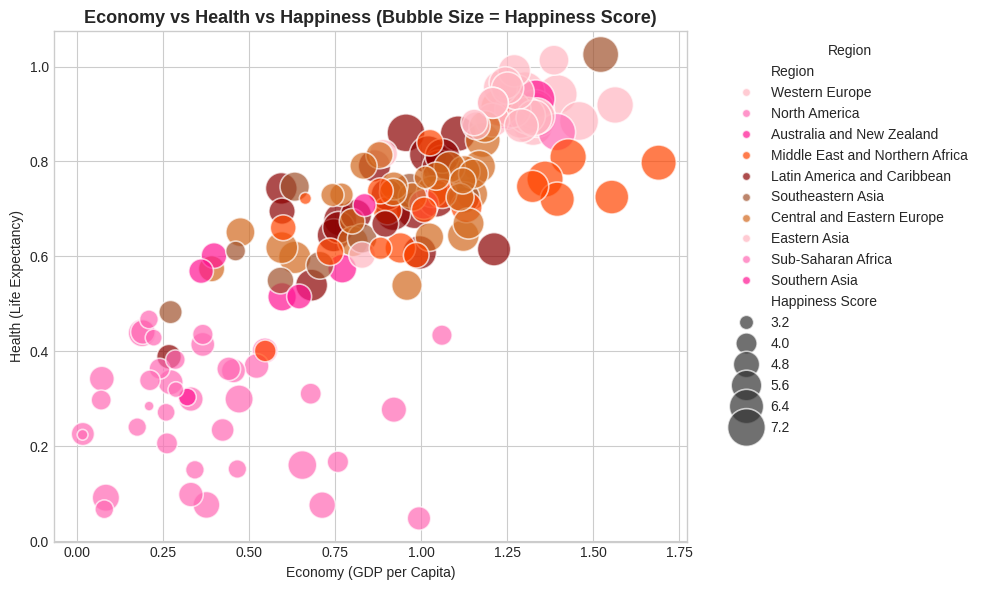

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a custom pink-red-brown palette
custom_palette = ["#ffb6c1", "#ff69b4", "#ff1493", "#ff4500", "#8b0000", "#a0522d", "#d2691e"]

plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=data,
    x='Economy (GDP per Capita)',
    y='Health (Life Expectancy)',
    size='Happiness Score',
    hue='Region',
    alpha=0.7,
    sizes=(50, 800),
    palette=sns.color_palette(custom_palette)
)

plt.title('Economy vs Health vs Happiness (Bubble Size = Happiness Score)', fontsize=13, fontweight='bold')
plt.xlabel('Economy (GDP per Capita)')
plt.ylabel('Health (Life Expectancy)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Region')
plt.tight_layout()
plt.show()


### ***<font color="#C890A7"><b><big>8. Icicle Chart</big></b></font>***


In [44]:
import plotly.express as px
import plotly.io as pio

pio.renderers.default = 'colab'


required_columns = ["Region", "Country", "Happiness Score"]
missing = [col for col in required_columns if col not in data.columns]

if missing:
    print(f"Missing columns in your dataset: {missing}")
else:

    pink_red_brown_scale = [
        [0.0, "#ffb6c1"],  # light pink
        [0.25, "#ff69b4"], # hot pink
        [0.5, "#ff1493"],  # deep pink
        [0.75, "#ff4500"], # orange red
        [1.0, "#8b4513"]   # saddle brown
    ]

    fig = px.icicle(
        data,
        path=["Region", "Country"],            # Hierarchy: Region → Country
        values="Happiness Score",              # Size based on happiness
        color="Happiness Score",               # Color based on score
        color_continuous_scale=pink_red_brown_scale,
        hover_data={
            "Economy (GDP per Capita)": ":.3f",
            "Health (Life Expectancy)": ":.3f",
            "Freedom": ":.3f"
        },
        title="🌸 World Happiness Icicle Chart<br><sup>Click to explore Region → Country hierarchy</sup>"
    )


    fig.update_layout(
        width=1200,
        height=800,
        margin=dict(t=100, l=50, r=50, b=50),
        coloraxis_colorbar=dict(title="Happiness Score"),
        font=dict(family="Arial", color="#4B2E2B"),
        paper_bgcolor="white"
    )

    fig.show()


### ***<font color="#C890A7"><b><big>9. Radial / Circular Heatmap</big></b></font>***


In [45]:
import numpy as np
import plotly.graph_objects as go
import plotly.io as pio

pio.renderers.default = "colab"

data = data.sort_values("Happiness Score", ascending=False).head(30).reset_index(drop=True)

features = [
    "Economy (GDP per Capita)",
    "Family",
    "Health (Life Expectancy)",
    "Freedom",
    "Trust (Government Corruption)",
    "Generosity",
    "Dystopia Residual"
]

# Select relevant feature columns
data_features = data[features]

# Normalize features 0–1
normed = (data_features - data_features.min()) / (data_features.max() - data_features.min())
M_norm = normed.values
M_raw = data_features.values

rows, cols = M_norm.shape
theta = np.linspace(0, 360, cols, endpoint=False)
r_base = np.arange(1, rows + 1)

theta_all, r_all, val_norm_all, val_raw_all, country_all, feature_all = [], [], [], [], [], []

for i in range(rows):
    for j in range(cols):
        theta_all.append(theta[j])
        r_all.append(r_base[i])
        val_norm_all.append(M_norm[i, j])
        val_raw_all.append(M_raw[i, j])
        country_all.append(data.loc[i, "Country"])
        feature_all.append(features[j])

# Custom pink-red-brown colorscale
pink_red_brown_scale = [
    [0.0, "#ffb6c1"],  # light pink
    [0.25, "#ff69b4"], # hot pink
    [0.5, "#ff1493"],  # deep pink
    [0.75, "#ff4500"], # orange red
    [1.0, "#8b4513"]   # saddle brown
]

fig = go.Figure()

# Use customdata to pass country, feature, raw value, and normalized value
customdata = np.stack([country_all, feature_all, val_raw_all, val_norm_all], axis=-1)

fig.add_trace(
    go.Scatterpolar(
        r=r_all,
        theta=theta_all,
        mode="markers",
        marker=dict(
            size=18,
            color=val_norm_all,
            colorscale=pink_red_brown_scale,
            cmin=0,
            cmax=1,
            colorbar=dict(
                title="Normalized value",
                titlefont=dict(color="#4B2E2B", size=14),
                tickfont=dict(color="#4B2E2B")
            ),
            line=dict(color="white", width=1)
        ),
        customdata=customdata,
        hovertemplate=(
            "<b>%{customdata[0]}</b><br>"         # Country
            "Feature: <b>%{customdata[1]}</b><br>" # Feature name
            "Value: %{customdata[2]:.3f}<br>"      # Raw value
            "Normalized: %{customdata[3]:.3f}<extra></extra>" # Normalized
        ),
    )
)

fig.update_layout(
    title="<b>Radial Heatmap of Happiness Factors</b><br>Hover for details",
    polar=dict(
        radialaxis=dict(
            tickmode="array",
            tickvals=r_base,
            ticktext=[f"{i+1}. {c}" for i, c in enumerate(data['Country'])],
            showgrid=False,
            showline=False
        ),
        angularaxis=dict(
            tickmode="array",
            tickvals=theta,
            ticktext=features,
            rotation=90,
            direction="clockwise"
        )
    ),
    showlegend=False,
    width=900,
    height=900,
    paper_bgcolor="white",
    font=dict(family="Arial", color="#4B2E2B")
)

fig.show()
